# **Notebook Summary**

This notebook is dedicated to processing and modeling Electrocardiogram (ECG) data to restore or predict individual ECG leads using deep learning techniques. The workflow includes data extraction, preprocessing, identifying optimal lead combinations, model development, training, and evaluation.

## **Key Components:**
- **Library Imports:** Utilizes essential libraries for data handling (`numpy`, `h5py`), visualization (`matplotlib`), machine learning (`sklearn`), and deep learning frameworks (`TensorFlow`, `PyTorch`).
- **Data Extraction:** Defines functions to extract and preprocess ECG signals from `.mat` files, ensuring data integrity and consistency.
- **Optimal Lead Selection:** Implements methods to find the best combination of three input leads for predicting each target ECG lead by minimizing prediction error.
- **Model Architecture:** Builds a U-Net-style encoder-decoder model with a transformer-based bottleneck for capturing both local and global ECG features.
- **Training Pipeline:** Implements data splitting, custom loss functions, model compilation, and training routines with callbacks for early stopping and learning rate adjustments.
- **Evaluation & Visualization:** Provides tools to evaluate model performance through metrics and visualize predictions versus true ECG leads.

This structured approach facilitates effective ECG signal analysis and restoration, enabling accurate predictions of individual leads based on the best selected input leads.


# Import Libraries

In [1]:
# Visualization library for plotting graphs and charts
import matplotlib.pyplot as plt

# File pattern matching and retrieval
from glob import glob

# Handling HDF5 file formats
import h5py

# Numerical operations and array handling
import numpy as np

# Progress bar utility for loops
from tqdm import tqdm

# Operating system interface for file and directory operations
import os

# Advanced iteration tools
import itertools
from itertools import combinations

# Mathematical functions and constants
import math

# Machine learning utilities for model selection, regression, and evaluation
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Deep learning framework for tensor computations
import torch

# Deep learning framework and its high-level API for building neural networks
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras import backend as K

# Generating random numbers and performing random operations
import random


# Import Data
The data is already preprocessed by MATLAB and we are just importing it here

In [2]:
def extract_ecg_signals(mat_file_path):
    """
    Extracts ECG signals from a MATLAB (.mat) file and returns them as a NumPy array.

    Parameters:
        mat_file_path (str): Path to the .mat file containing ECG data.

    Returns:
        np.ndarray: Array of extracted ECG samples.
    """
    # Initialize list to store all ECG samples and a counter for skipped samples
    all_ecg_samples = []
    num_skipped = 0

    # Open the .mat file in read mode
    with h5py.File(mat_file_path, 'r') as mat_file:
        # Check if 'filtered_data' group exists in the file
        if 'filtered_data' not in mat_file:
            raise KeyError("'filtered_data' group not found in the .mat file.")

        # Access the 'filtered_data' group
        filtered_data = mat_file['filtered_data']
        total_samples = len(filtered_data)

        # Display the total number of samples to process
        print(f"Total samples to process: {total_samples}")

        # Iterate over each sample in the 'filtered_data' group with a progress bar
        for sample_name in tqdm(filtered_data, desc="Extracting ECG Samples", total=total_samples):
            sample = filtered_data[sample_name]

            # Check if the sample contains a 'signal' dataset or group
            if 'signal' in sample:
                signal = sample['signal']

                # If 'signal' is a dataset, process it directly
                if isinstance(signal, h5py.Dataset):
                    leads_array = signal[()]
                    leads_array_transposed = leads_array.T
                    all_ecg_samples.append(leads_array_transposed)

                # If 'signal' is a group, process each lead individually
                elif isinstance(signal, h5py.Group):
                    leads = []
                    # Sort lead names numerically to maintain order
                    for lead_name in sorted(signal.keys(), key=lambda x: int(''.join(filter(str.isdigit, x)) or 0)):
                        lead_data = signal[lead_name][()]
                        leads.append(lead_data)
                    
                    # Ensure there are exactly 12 leads; skip if not
                    if len(leads) != 12:
                        print(f"Warning: '{sample_name}' contains {len(leads)} leads instead of 12. Skipping.")
                        num_skipped += 1
                        continue

                    # Stack leads into a single array and add to the samples list
                    leads_array_transposed = np.stack(leads, axis=0)
                    all_ecg_samples.append(leads_array_transposed)

                # Handle unexpected 'signal' structures
                else:
                    print(f"Unknown 'signal' structure in '{sample_name}'. Skipping.")
                    num_skipped += 1
            else:
                # If 'signal' is not found in the sample, skip it
                print(f"'signal' not found in '{sample_name}'. Skipping.")
                num_skipped += 1

    # Display extraction summary
    print(f"Extraction completed. Total samples extracted: {len(all_ecg_samples)}. Samples skipped: {num_skipped}.")

    # Convert the list of samples to a NumPy array
    ecg_data = np.array(all_ecg_samples)

    # Display the shape of the final ECG data array
    print(f"Final ECG data shape: {ecg_data.shape}")

    # Uncomment the following lines to save the extracted data to a NumPy file
    # np.save(output_numpy_file, ecg_data)
    # print(f"Saved ECG data to '{output_numpy_file}'.")

    return ecg_data


def display_record(record_num, ecg_data):
    """
    Visualizes a specific ECG record by plotting its leads.

    Parameters:
        record_num (int): Index of the ECG record to display.
        ecg_data (np.ndarray): Array containing all ECG samples.
    """
    # Retrieve the specified ECG sample
    first_sample = ecg_data[record_num]
    print(f"Sample shape: {first_sample.shape}")
    
    # Plot Lead 1 of the ECG sample
    lead1 = first_sample[0]
    plt.figure(figsize=(12, 4))
    plt.plot(lead1)
    plt.title("Lead 1 of ECG Sample")
    plt.xlabel("Sample")
    plt.ylabel("Amplitude")
    plt.grid(True)
    plt.show()
    
    # Plot all 12 leads of the ECG sample in a grid layout
    plt.figure(figsize=(15, 20))
    for lead in range(12):
        plt.subplot(6, 2, lead + 1)
        plt.plot(ecg_data[record_num, lead, :])
        plt.title(f"Lead {lead + 1}")
        plt.xlabel("Sample")
        plt.ylabel("Amplitude")
        plt.grid(True)
    plt.tight_layout()
    plt.show()


### Extract Data and save it as a variable

In [3]:
# Define the directory containing ECG data files
data_dir = '/kaggle/input/chunk1-ecg/'

# Create a file pattern to match preprocessed ECG .mat files
file_pattern = os.path.join(data_dir, 'preprocessed_ecg_data_chunk_*_filtered.mat')

# Retrieve and sort the list of files matching the pattern
file_list = sorted(glob(file_pattern))

# Check if any files were found; raise an error if none are present
if not file_list:
    raise FileNotFoundError(f"No files found matching pattern: {file_pattern}")

try:
    # Extract ECG signals from each file and concatenate them into a single array
    ecg_data = np.concatenate(
        [extract_ecg_signals(file_path) for file_path in file_list],
        axis=0
    )
    # Display the shape of the concatenated ECG data
    print(f"ECG data shape: {ecg_data.shape}")
except Exception as e:
    # Handle and report any errors that occur during concatenation
    print(f"An error occurred during concatenation: {e}")


Total samples to process: 361


Extracting ECG Samples: 100%|██████████| 361/361 [00:01<00:00, 197.15it/s]


Extraction completed. Total samples extracted: 361. Samples skipped: 0.
Final ECG data shape: (361, 12, 5000)
Total samples to process: 130


Extracting ECG Samples: 100%|██████████| 130/130 [00:00<00:00, 206.78it/s]


Extraction completed. Total samples extracted: 130. Samples skipped: 0.
Final ECG data shape: (130, 12, 5000)
Total samples to process: 334


Extracting ECG Samples: 100%|██████████| 334/334 [00:01<00:00, 200.20it/s]


Extraction completed. Total samples extracted: 334. Samples skipped: 0.
Final ECG data shape: (334, 12, 5000)
Total samples to process: 437


Extracting ECG Samples: 100%|██████████| 437/437 [00:02<00:00, 200.25it/s]


Extraction completed. Total samples extracted: 437. Samples skipped: 0.
Final ECG data shape: (437, 12, 5000)
Total samples to process: 406


Extracting ECG Samples: 100%|██████████| 406/406 [00:02<00:00, 189.58it/s]


Extraction completed. Total samples extracted: 406. Samples skipped: 0.
Final ECG data shape: (406, 12, 5000)
Total samples to process: 455


Extracting ECG Samples: 100%|██████████| 455/455 [00:02<00:00, 207.80it/s]


Extraction completed. Total samples extracted: 455. Samples skipped: 0.
Final ECG data shape: (455, 12, 5000)
Total samples to process: 443


Extracting ECG Samples: 100%|██████████| 443/443 [00:02<00:00, 206.83it/s]


Extraction completed. Total samples extracted: 443. Samples skipped: 0.
Final ECG data shape: (443, 12, 5000)
Total samples to process: 429


Extracting ECG Samples: 100%|██████████| 429/429 [00:02<00:00, 209.64it/s]


Extraction completed. Total samples extracted: 429. Samples skipped: 0.
Final ECG data shape: (429, 12, 5000)
Total samples to process: 411


Extracting ECG Samples: 100%|██████████| 411/411 [00:01<00:00, 205.76it/s]


Extraction completed. Total samples extracted: 411. Samples skipped: 0.
Final ECG data shape: (411, 12, 5000)
Total samples to process: 444


Extracting ECG Samples: 100%|██████████| 444/444 [00:02<00:00, 185.31it/s]


Extraction completed. Total samples extracted: 444. Samples skipped: 0.
Final ECG data shape: (444, 12, 5000)
Total samples to process: 433


Extracting ECG Samples: 100%|██████████| 433/433 [00:02<00:00, 196.25it/s]


Extraction completed. Total samples extracted: 433. Samples skipped: 0.
Final ECG data shape: (433, 12, 5000)
Total samples to process: 407


Extracting ECG Samples: 100%|██████████| 407/407 [00:02<00:00, 186.95it/s]


Extraction completed. Total samples extracted: 407. Samples skipped: 0.
Final ECG data shape: (407, 12, 5000)
ECG data shape: (4690, 12, 5000)


### Visualize a sample from imported dataset

Sample shape: (12, 5000)


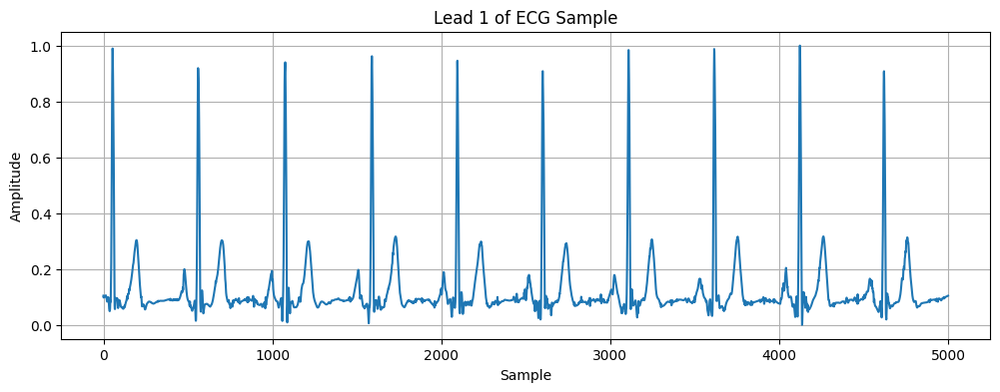

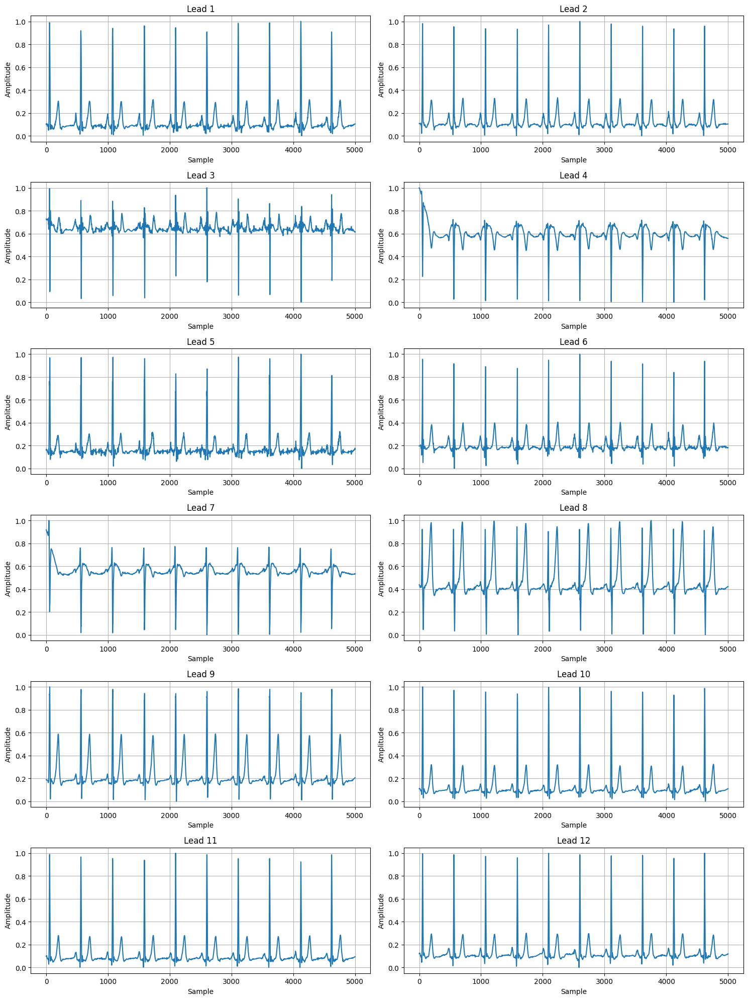

In [4]:
display_record(0, ecg_data)

# Finding the Best 3-lead Combination using Linear Regression

In [5]:
def rmse_torch(y_true, y_pred):
    """
    Calculates the Root Mean Squared Error (RMSE) between true and predicted values using PyTorch.
    
    Parameters:
        y_true (torch.Tensor): Tensor containing true target values.
        y_pred (torch.Tensor): Tensor containing predicted values.
    
    Returns:
        torch.Tensor: The calculated RMSE value.
    """
    # Compute the squared differences between true and predicted values
    squared_diff = (y_true - y_pred) ** 2
    # Calculate the mean of the squared differences
    mean_squared_diff = torch.mean(squared_diff)
    # Return the square root of the mean squared differences as RMSE
    return torch.sqrt(mean_squared_diff)


def gpu_lead_selection_for_one_lead(ecg_data, lead_to_predict, device='cuda', n_splits=3):
    """
    Selects the best combination of leads for predicting a specific ECG lead using GPU acceleration.
    
    Parameters:
        ecg_data (np.ndarray): Array containing ECG samples with shape (records, leads, samples).
        lead_to_predict (int): Index of the ECG lead to be predicted.
        device (str): Device to perform computations on ('cuda' for GPU, 'cpu' for CPU).
        n_splits (int): Number of data splits for cross-validation.
    
    Returns:
        tuple: Best combination of leads and the corresponding average RMSE.
    """
    # Convert ECG data to a PyTorch tensor and move it to the specified device
    data_t = torch.tensor(ecg_data, dtype=torch.float32, device=device)
    num_records, num_leads, num_samples = data_t.shape
    
    # Generate all possible combinations of 3 leads excluding the target lead
    combos = list(combinations([l for l in range(num_leads) if l != lead_to_predict], 3))

    # Pre-generate random splits for cross-validation to ensure consistency across combinations
    splits = []
    for _ in range(n_splits):
        # Shuffle record indices randomly
        idx = torch.randperm(num_records, device=device)
        train_size = int(0.8 * num_records)
        train_idx = idx[:train_size]
        test_idx  = idx[train_size:]
        splits.append((train_idx, test_idx))

    # Initialize variables to track the best RMSE and corresponding lead combination
    best_rmse = math.inf
    best_combo = None

    # Iterate over each combination of leads with a progress bar
    for combo in tqdm(combos, desc=f"Lead {lead_to_predict}", leave=False):
        rmse_list = []
        # Perform cross-validation for the current combination
        for (train_idx, test_idx) in splits:
            # Split data into training and testing sets
            train_data = data_t[train_idx]    # Shape: (train_size, selected_leads, num_samples)
            test_data  = data_t[test_idx]     # Shape: (test_size, selected_leads, num_samples)

            # Prepare training inputs by selecting the chosen leads and reshaping
            X_train = train_data[:, combo, :].reshape(-1, 3 * num_samples)
            # Prepare training targets by selecting the target lead
            Y_train = train_data[:, lead_to_predict, :]

            # Perform least squares regression to find the weight matrix
            results = torch.linalg.lstsq(X_train, Y_train)
            W = results.solution  # Shape: (3 * num_samples, num_samples)

            # Prepare testing inputs and targets
            X_test = test_data[:, combo, :].reshape(-1, 3 * num_samples)
            Y_test = test_data[:, lead_to_predict, :]

            # Predict the target lead using the weight matrix
            Y_pred = X_test @ W
            # Calculate RMSE between true and predicted values
            curr_rmse = rmse_torch(Y_test.reshape(-1), Y_pred.reshape(-1)).item()
            rmse_list.append(curr_rmse)

        # Compute the average RMSE across all splits for the current combination
        avg_rmse = float(np.mean(rmse_list))
        # Update the best RMSE and combination if the current average RMSE is lower
        if avg_rmse < best_rmse:
            best_rmse = avg_rmse
            best_combo = combo

    # Return the best lead combination and its corresponding RMSE
    return best_combo, best_rmse


### Using the Function to find Best 3-lead-combination for all of the 12 leads

In [6]:
# Iterate over each ECG lead to perform lead selection and evaluate prediction performance
for lead in range(12):
    # Select the best combination of leads for the current lead and calculate the corresponding RMSE
    best_combo, best_rmse = gpu_lead_selection_for_one_lead(ecg_data, lead_to_predict=lead)
    
    # Display the results for the current lead
    print("Lead", lead)
    print(f"Best combo: {best_combo}, RMSE: {best_rmse}")


Lead 0
Best combo: (3, 4, 10), RMSE: 0.16996373732884726


Lead 1
Best combo: (3, 5, 11), RMSE: 0.13356504837671915


Lead 2
Best combo: (3, 4, 5), RMSE: 0.19419639805952707


Lead 3
Best combo: (1, 4, 6), RMSE: 0.30894097685813904


Lead 4
Best combo: (0, 2, 3), RMSE: 0.21773920953273773


Lead 5
Best combo: (1, 2, 3), RMSE: 0.1461259126663208


Lead 6
Best combo: (0, 3, 7), RMSE: 0.24187606076399484


Lead 7
Best combo: (2, 6, 8), RMSE: 0.18719691038131714


Lead 8
Best combo: (1, 7, 9), RMSE: 0.16731557250022888


Lead 9
Best combo: (3, 8, 10), RMSE: 0.12958664198716482


Lead 10
Best combo: (3, 9, 11), RMSE: 0.09988856812318166


Lead 11
Best combo: (0, 1, 10), RMSE: 0.12465564161539078


# Deep Learning Model
For reconstructing the lost lead! <br>
We used a combination of U-Net and transformers to design our model!

## Designing the Model

In [7]:
from tensorflow.keras import mixed_precision

# Mixed Precision can improve performance
# by utilizing both float16 and float32 data types.
mixed_precision.set_global_policy('mixed_float16')

class PositionalEncoding(layers.Layer):
    """
    Implements positional encoding to inject information about the position of each element
    in the sequence, which is essential for transformer models to capture the order of the sequence.
    """
    def __init__(self, model_dim, **kwargs):
        """
        Initializes the PositionalEncoding layer.

        Parameters:
            model_dim (int): Dimension of the model.
            **kwargs: Additional keyword arguments for the base Layer class.
        """
        # Initialize the base Layer with any additional keyword arguments
        super(PositionalEncoding, self).__init__(**kwargs)
        self.model_dim = model_dim

    def call(self, x):
        """
        Applies positional encoding to the input tensor.

        Parameters:
            x (tf.Tensor): Input tensor with shape (batch_size, seq_len, model_dim).

        Returns:
            tf.Tensor: Tensor with positional encoding added.
        """
        # Determine the sequence length from the input tensor
        seq_len = tf.shape(x)[1]
        # Create a tensor of position indices
        position = tf.cast(tf.range(seq_len), tf.float32)[:, tf.newaxis]
        # Create a tensor of dimension indices
        i = tf.range(self.model_dim, dtype=tf.float32)

        # Calculate angle rates for positional encoding
        i_floor = tf.cast(tf.math.floordiv(i, 2), tf.float32)
        angle_rates = 1.0 / tf.pow(10000.0, (2.0 * i_floor) / self.model_dim)
        angle_rads = position * angle_rates

        # Compute sine and cosine for even and odd indices
        sines   = tf.math.sin(angle_rads[:, 0::2])
        cosines = tf.math.cos(angle_rads[:, 1::2])
        pos_encoding = tf.concat([sines, cosines], axis=-1)
        pos_encoding = pos_encoding[tf.newaxis, ...]
        pos_encoding = tf.cast(pos_encoding, dtype=x.dtype)

        # Add positional encoding to the input tensor
        return x + pos_encoding

    def get_config(self):
        """
        Returns the configuration of the layer for serialization.

        Returns:
            dict: Configuration dictionary.
        """
        # Retrieve the base configuration and update with custom attributes
        config = super(PositionalEncoding, self).get_config()
        config.update({
            'model_dim': self.model_dim
        })
        return config

    @classmethod
    def from_config(cls, config):
        """
        Creates a layer from its configuration.

        Parameters:
            config (dict): Configuration dictionary.

        Returns:
            PositionalEncoding: An instance of the PositionalEncoding layer.
        """
        # Instantiate the layer using the configuration dictionary
        return cls(**config)

def transformer_encoder(inputs,
                        head_size,
                        num_heads,
                        ff_dim,
                        dropout=0.1,
                        l2_reg=1e-5):
    """
    Constructs a single Transformer encoder block with Layer Normalization, Multi-Head
    Self-Attention, and a Feed-Forward Network, including residual connections.

    Parameters:
        inputs (tf.Tensor): Input tensor to the encoder block.
        head_size (int): Size of each attention head.
        num_heads (int): Number of attention heads.
        ff_dim (int): Dimension of the feed-forward network.
        dropout (float): Dropout rate.
        l2_reg (float): L2 regularization factor.

    Returns:
        tf.Tensor: Output tensor after passing through the Transformer encoder block.
    """
    # Apply Layer Normalization before Multi-Head Self-Attention
    x_norm1 = layers.LayerNormalization(epsilon=1e-6)(inputs)
    # Apply Multi-Head Self-Attention with specified parameters and regularization
    attn_out = layers.MultiHeadAttention(
        key_dim=head_size,
        num_heads=num_heads,
        dropout=dropout,
        kernel_regularizer=keras.regularizers.l2(l2_reg),
        bias_regularizer=keras.regularizers.l2(l2_reg),
    )(x_norm1, x_norm1)
    # Apply Dropout to the attention output
    attn_out = layers.Dropout(dropout)(attn_out)
    # Add residual connection from the original input
    x_out1 = layers.Add()([inputs, attn_out])

    # Apply Layer Normalization before the Feed-Forward Network
    x_norm2 = layers.LayerNormalization(epsilon=1e-6)(x_out1)
    # Apply the first Dense layer of the Feed-Forward Network with GELU activation
    ffn = layers.Dense(
        ff_dim,
        activation='gelu',
        kernel_regularizer=keras.regularizers.l2(l2_reg),
        bias_regularizer=keras.regularizers.l2(l2_reg),
    )(x_norm2)
    # Apply the second Dense layer to project back to the original dimension
    ffn = layers.Dense(
        x_out1.shape[-1],
        kernel_regularizer=keras.regularizers.l2(l2_reg),
        bias_regularizer=keras.regularizers.l2(l2_reg),
    )(ffn)
    # Apply Dropout to the Feed-Forward Network output
    ffn = layers.Dropout(dropout)(ffn)
    # Add residual connection from the previous layer
    x_out2 = layers.Add()([x_out1, ffn])

    return x_out2

def residual_cnn_block(x,
                       filters,
                       kernel_size=3,
                       strides=1,
                       l2_reg=1e-5,
                       dropout_rate=0.0,
                       block_name="res_cnn_block"):
    """
    Constructs a Residual CNN block with two Conv1D layers, Batch Normalization, ReLU activations,
    and an optional Dropout layer. Includes a skip connection, which may include downsampling
    if strides are greater than 1 or if the number of filters changes.

    Parameters:
        x (tf.Tensor): Input tensor to the CNN block.
        filters (int): Number of convolutional filters.
        kernel_size (int): Size of the convolutional kernel.
        strides (int): Stride size for the convolution.
        l2_reg (float): L2 regularization factor.
        dropout_rate (float): Dropout rate.
        block_name (str): Base name for the block's layers.

    Returns:
        tf.Tensor: Output tensor after passing through the Residual CNN block.
    """
    # Store the original input for the skip connection
    shortcut = x

    # First Conv1D layer with specified filters, kernel size, and strides
    x = layers.Conv1D(
        filters=filters,
        kernel_size=kernel_size,
        strides=strides,
        padding='same',
        kernel_regularizer=keras.regularizers.l2(l2_reg),
        bias_regularizer=keras.regularizers.l2(l2_reg),
        name=f"{block_name}_conv1"
    )(x)
    # Apply Batch Normalization
    x = layers.BatchNormalization(name=f"{block_name}_bn1")(x)
    # Apply ReLU activation
    x = layers.ReLU(name=f"{block_name}_relu1")(x)

    # Second Conv1D layer with the same number of filters and kernel size
    x = layers.Conv1D(
        filters=filters,
        kernel_size=kernel_size,
        strides=1,
        padding='same',
        kernel_regularizer=keras.regularizers.l2(l2_reg),
        bias_regularizer=keras.regularizers.l2(l2_reg),
        name=f"{block_name}_conv2"
    )(x)
    # Apply Batch Normalization
    x = layers.BatchNormalization(name=f"{block_name}_bn2")(x)

    # Adjust the shortcut connection if the number of filters has changed or if downsampling is applied
    if shortcut.shape[-1] != filters or strides > 1:
        # Apply Conv1D to the shortcut to match the dimensions
        shortcut = layers.Conv1D(
            filters=filters,
            kernel_size=1,
            strides=strides,
            padding='same',
            kernel_regularizer=keras.regularizers.l2(l2_reg),
            bias_regularizer=keras.regularizers.l2(l2_reg),
            name=f"{block_name}_conv_skip"
        )(shortcut)
        # Apply Batch Normalization to the adjusted shortcut
        shortcut = layers.BatchNormalization(name=f"{block_name}_bn_skip")(shortcut)

    # Add the main path and the shortcut path
    x = layers.Add(name=f"{block_name}_add")([shortcut, x])
    # Apply ReLU activation after the addition
    x = layers.ReLU(name=f"{block_name}_relu2")(x)

    # Optionally apply Dropout if a dropout rate is specified
    if dropout_rate > 0.0:
        x = layers.Dropout(dropout_rate, name=f"{block_name}_dropout")(x)

    return x

def build_ecg_restoration_unet_transformer(
    input_length=5000,
    num_input_leads=3,
    # Transformer hyperparameters
    transformer_params={
        'num_layers': 2,
        'head_size': 16,
        'num_heads': 4,
        'ff_dim': 128,
        'dropout': 0.1
    },
    l2_reg=1e-5,
    dropout_rate=0.2,
):
    """
    Builds a U-Net-style 1D architecture for ECG restoration, integrating a Transformer-based
    bottleneck for enhanced feature representation. The model comprises an encoder, transformer
    bottleneck, and decoder with residual CNN blocks and skip connections.

    Parameters:
        input_length (int): Length of the input ECG signal.
        num_input_leads (int): Number of input ECG leads.
        transformer_params (dict): Dictionary containing Transformer hyperparameters.
        l2_reg (float): L2 regularization factor.
        dropout_rate (float): Dropout rate applied after the Transformer layers.

    Returns:
        keras.Model: Compiled U-Net-Transformer model ready for training.
    """

    # -------------------------------------------------------------------------
    # INPUT
    # -------------------------------------------------------------------------
    # Define the input layer with the specified shape
    inputs = keras.Input(shape=(input_length, num_input_leads), name="ecg_input")

    # -------------------------------------------------------------------------
    # ENCODER STAGE
    # -------------------------------------------------------------------------
    # First encoder block: downsample the input and increase filter dimensions
    e1 = residual_cnn_block(
        inputs,
        filters=32,
        kernel_size=5,
        strides=2,
        l2_reg=l2_reg,
        dropout_rate=0.1,
        block_name="enc_block1"
    )  # Output shape: (input_length / 2, 32)

    # Second encoder block: further downsample and increase filter dimensions
    e2 = residual_cnn_block(
        e1,
        filters=64,
        kernel_size=3,
        strides=2,
        l2_reg=l2_reg,
        dropout_rate=0.1,
        block_name="enc_block2"
    )  # Output shape: (input_length / 4, 64)

    # -------------------------------------------------------------------------
    # BOTTLENECK (TRANSFORMER)
    # -------------------------------------------------------------------------
    # Calculate the model dimension based on Transformer parameters
    model_dim = transformer_params['head_size'] * transformer_params['num_heads']

    # Project the encoder output to the model dimension suitable for the Transformer
    x_bottleneck = layers.Dense(
        model_dim,
        kernel_regularizer=keras.regularizers.l2(l2_reg),
        bias_regularizer=keras.regularizers.l2(l2_reg),
        name="bottleneck_dense_project",
    )(e2)

    # Apply positional encoding to the projected encoder output
    x_bottleneck = PositionalEncoding(model_dim=model_dim)(x_bottleneck)

    # Stack multiple Transformer encoder blocks as specified by the number of layers
    for i in range(transformer_params['num_layers']):
        x_bottleneck = transformer_encoder(
            x_bottleneck,
            head_size=transformer_params['head_size'],
            num_heads=transformer_params['num_heads'],
            ff_dim=transformer_params['ff_dim'],
            dropout=transformer_params['dropout'],
            l2_reg=l2_reg
        )
        # Apply Dropout after each Transformer encoder block
        x_bottleneck = layers.Dropout(dropout_rate, name=f"transformer_dropout_{i+1}")(x_bottleneck)

    # Project the Transformer output back to match the encoder's channel dimension
    x_bottleneck = layers.Dense(
        64,
        kernel_regularizer=keras.regularizers.l2(l2_reg),
        bias_regularizer=keras.regularizers.l2(l2_reg),
        name="bottleneck_dense_back"
    )(x_bottleneck)

    # -------------------------------------------------------------------------
    # DECODER STAGE
    # -------------------------------------------------------------------------
    # First decoder block: upsample and concatenate with the corresponding encoder output
    d2 = layers.UpSampling1D(size=2, name="dec_upsample2")(x_bottleneck)  # Output shape: (input_length / 2, 64)
    # Concatenate with the output from the first encoder block for skip connection
    d2 = layers.Concatenate(name="skip_connect_e1")([d2, e1])  # Output shape: (input_length / 2, 96)

    # Apply a residual CNN block to refine the concatenated features
    d2 = residual_cnn_block(
        d2,
        filters=32,   # Reduce the number of filters back to 32
        kernel_size=3,
        strides=1,
        l2_reg=l2_reg,
        dropout_rate=0.1,
        block_name="dec_block2"
    )  # Output shape: (input_length / 2, 32)

    # Second decoder block: upsample to the original input length
    d1 = layers.UpSampling1D(size=2, name="dec_upsample1")(d2)  # Output shape: (input_length, 32)

    # Optionally, concatenate with the original input for additional skip connections
    # d1 = layers.Concatenate()([d1, inputs])  # Uncomment to enable

    # Apply a final residual CNN block for refinement
    d1 = residual_cnn_block(
        d1,
        filters=32,
        kernel_size=3,
        strides=1,
        l2_reg=l2_reg,
        dropout_rate=0.1,
        block_name="dec_block1"
    )  # Output shape: (input_length, 32)

    # -------------------------------------------------------------------------
    # OUTPUT LAYER -> (batch, input_length, 1)
    # -------------------------------------------------------------------------
    # Define the output layer to reconstruct the ECG lead with a single channel
    outputs = layers.Conv1D(
        filters=1,
        kernel_size=1,
        padding='same',
        activation=None,
        dtype='float32',  # Ensure the output is in float32 precision
        kernel_regularizer=keras.regularizers.l2(l2_reg),
        bias_regularizer=keras.regularizers.l2(l2_reg),
        name="restored_lead"
    )(d1)

    # Instantiate the Keras Model with defined inputs and outputs
    model = keras.Model(inputs=inputs, outputs=outputs,
                        name="ECG_Restoration_UNet_Transformer")
    return model


## Data handling

### Train-Validation Preprocessing

In [8]:
# Generate an array of indices corresponding to the ECG data samples
indices = np.arange(len(ecg_data))

# Set a random seed for reproducibility of the shuffling process
np.random.seed(42)

# Shuffle the indices to randomize the order of the ECG samples
np.random.shuffle(indices)

# Determine the number of samples to include in the training set (85% of the data)
train_size = int(0.85 * len(ecg_data))

# Split the shuffled indices into training and validation sets
train_indices = indices[:train_size]
val_indices   = indices[train_size:]

# Create the training and validation datasets using the selected indices
train_data = ecg_data[train_indices]
val_data   = ecg_data[val_indices]

# Display the shapes of the training and validation datasets for verification
print(f"Train data shape: {train_data.shape}")
print(f"Validation data shape: {val_data.shape}")


Train data shape: (3986, 12, 5000)
Validation data shape: (704, 12, 5000)


### Make data ready for the model

In [9]:
def create_dataset_for_model(train_data, val_data, input_leads, target_lead):
    """
    Prepares training and validation datasets for the model by selecting input leads,
    targeting a specific lead, and reshaping the data to the required format.
    
    Parameters:
        train_data (np.ndarray): Array containing training ECG samples with shape (N, leads, samples).
        val_data (np.ndarray): Array containing validation ECG samples with shape (N, leads, samples).
        input_leads (list or array-like): Indices of the leads to be used as input features.
        target_lead (int): Index of the lead to be predicted.
    
    Returns:
        tuple: Tuple containing reshaped training and validation datasets:
            - X_train (np.ndarray): Training inputs with shape (train_size, samples, input_leads).
            - y_train (np.ndarray): Training targets with shape (train_size, samples, 1).
            - X_val (np.ndarray): Validation inputs with shape (val_size, samples, input_leads).
            - y_val (np.ndarray): Validation targets with shape (val_size, samples, 1).
    """
    # Select input leads from the training data and transpose to shape (N, samples, input_leads)
    X_train = train_data[:, input_leads, :].transpose((0, 2, 1))  # from (N, 3, 5000) -> (N, 5000, 3)
    
    # Select the target lead from the training data and transpose to shape (N, samples)
    y_train = train_data[:, target_lead, :].transpose((0, 1))     # from (N, 5000)   -> (N, 5000)
    # Expand dimensions to shape (N, samples, 1) for compatibility with model output
    y_train = np.expand_dims(y_train, axis=-1)                    # -> (N, 5000, 1)
    
    # Select input leads from the validation data and transpose to shape (N, samples, input_leads)
    X_val = val_data[:, input_leads, :].transpose((0, 2, 1))      # from (N, 3, 5000) -> (N, 5000, 3)
    
    # Select the target lead from the validation data and transpose to shape (N, samples)
    y_val = val_data[:, target_lead, :].transpose((0, 1))        # from (N, 5000)   -> (N, 5000)
    # Expand dimensions to shape (N, samples, 1) for compatibility with model output
    y_val = np.expand_dims(y_val, axis=-1)                        # -> (N, 5000, 1)
    
    # Display the shapes of the prepared datasets for verification
    print("X_train shape:", X_train.shape)  # (train_size, 5000, 3)
    print("y_train shape:", y_train.shape)  # (train_size, 5000, 1)
    print("X_val shape:  ", X_val.shape)    # (val_size, 5000, 3)
    print("y_val shape:  ", y_val.shape)    # (val_size, 5000, 1)
    
    # Return the prepared training and validation datasets
    return X_train, y_train, X_val, y_val


## Compiling the Model

In [10]:
def rmse_loss(y_true, y_pred):
    """
    Computes the Root Mean Squared Error (RMSE) loss between true and predicted values.

    Parameters:
        y_true (tf.Tensor): Tensor containing true target values.
        y_pred (tf.Tensor): Tensor containing predicted values.

    Returns:
        tf.Tensor: The calculated RMSE loss.
    """
    # Calculate the Mean Squared Error (MSE) between true and predicted values
    mse = tf.reduce_mean(tf.square(y_true - y_pred))
    
    # Compute the square root of MSE to obtain RMSE, ensuring numerical stability
    return tf.sqrt(tf.maximum(mse, 1e-12))  # Adding epsilon to prevent sqrt(0)


def create_and_compile_model():
    """
    Builds and compiles the ECG restoration model using a U-Net-Transformer architecture.

    This function constructs the model, defines the optimizer, specifies the loss function,
    and sets up evaluation metrics for training.

    Returns:
        keras.Model: The compiled ECG restoration model ready for training.
    """
    # Build the U-Net-Transformer model with specified parameters
    model = build_ecg_restoration_unet_transformer(
        input_length=5000,
        num_input_leads=len(input_leads),
        transformer_params={
            'num_layers': 2,
            'head_size': 16,
            'num_heads': 4,
            'ff_dim': 128,
            'dropout': 0.1
        },
        l2_reg=1e-5,
        dropout_rate=0.2,
    )
    
    # Define the learning rate for the Adam optimizer
    learning_rate = 1e-4
    # Initialize the Adam optimizer with the specified learning rate
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    
    # Initialize the SGD optimizer with a defined learning rate
    sgd_optimizer = keras.optimizers.SGD(
        learning_rate=1e-3   # You can adjust the learning rate
        # momentum=0.9,         # Momentum can help accelerate SGD
        # nesterov=True         # Nesterov momentum
    )
    
    # Define a cosine similarity metric to evaluate the similarity between true and predicted values
    cosine_similarity = tf.keras.metrics.CosineSimilarity(
        axis=1,  # Compute similarity across the 5000 time steps
        name='cosine_similarity'
    )
    
    # Compile the model with the specified optimizer, loss function, and evaluation metrics
    model.compile(
        optimizer=optimizer,
        loss=rmse_loss,
        metrics=[cosine_similarity, tf.keras.metrics.RootMeanSquaredError(name='rmse')]
    )
    
    # Optionally, display the model architecture summary
    # print(model.summary())
    
    # Return the compiled model
    return model


## Training Phase

In [11]:
def train_model(model, X_train, y_train, X_val, y_val):
    """
    Trains the ECG restoration model using the provided training and validation datasets.
    
    This function sets up essential callbacks for early stopping, learning rate reduction,
    and model checkpointing to optimize the training process and prevent overfitting.
    
    Parameters:
        model (keras.Model): The compiled Keras model to be trained.
        X_train (np.ndarray): Training input data with shape (train_size, samples, input_leads).
        y_train (np.ndarray): Training target data with shape (train_size, samples, 1).
        X_val (np.ndarray): Validation input data with shape (val_size, samples, input_leads).
        y_val (np.ndarray): Validation target data with shape (val_size, samples, 1).
    
    Returns:
        keras.callbacks.History: A History object containing training metrics and loss values.
    """
    
    # Initialize EarlyStopping callback to halt training when validation loss stops improving
    early_stopping = keras.callbacks.EarlyStopping(
        monitor='val_loss',          # Metric to monitor for improvement
        patience=10,                 # Number of epochs with no improvement after which training stops
        restore_best_weights=True,   # Restore model weights from the epoch with the best validation loss
        verbose=1,                   # Verbosity mode
        min_delta=1e-4               # Minimum change in the monitored metric to qualify as an improvement
    )
    
    # Initialize ReduceLROnPlateau callback to reduce learning rate when validation loss plateaus
    reduce_lr = keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',          # Metric to monitor for plateau
        factor=0.5,                  # Factor by which the learning rate will be reduced
        patience=4,                  # Number of epochs with no improvement after which learning rate will be reduced
        min_lr=1e-7,                 # Lower bound on the learning rate
        min_delta=1e-4,              # Minimum change in the monitored metric to qualify as an improvement
        verbose=1                    # Verbosity mode
    )
    
    # Initialize ModelCheckpoint callback to save the best model based on validation loss
    checkpoint = keras.callbacks.ModelCheckpoint(
        filepath='best_model_transformer.keras',  # Path to save the model file
        monitor='val_loss',                        # Metric to monitor for saving the best model
        save_best_only=True,                       # Save only the model with the best performance on the monitored metric
        save_weights_only=False                     # Save the entire model (architecture + weights)
    )
    
    # Aggregate all callbacks into a list for easy management
    callbacks_list = [early_stopping, reduce_lr, checkpoint]
    
    # Train the model using the training data, validating on the validation set
    hist = model.fit(
        x=X_train,                     # Training input data
        y=y_train,                     # Training target data
        validation_data=(X_val, y_val),# Validation data for evaluating model performance
        epochs=100,                    # Maximum number of epochs for training
        batch_size=8,                  # Number of samples per gradient update
        callbacks=callbacks_list,      # List of callback functions to apply during training
        verbose=1                      # Verbosity mode for logging
    )
    
    # Return the training history containing metrics and loss values
    return hist

# Evaluating Models' performance

In [12]:
def evaluate_model(model, hist, X_val, y_val):
    """
    Evaluates the trained ECG restoration model on the validation dataset and visualizes performance metrics.
    
    This function assesses the model's performance by computing evaluation metrics on the validation set
    and plots the training history for RMSE and cosine similarity to analyze the model's learning progress.
    
    Parameters:
        model (keras.Model): The trained Keras model to be evaluated.
        hist (keras.callbacks.History): The History object returned by the model's fit method, containing training metrics.
        X_val (np.ndarray): Validation input data with shape (val_size, samples, input_leads).
        y_val (np.ndarray): Validation target data with shape (val_size, samples, 1).
    
    Returns:
        None
    """
    
    # Compute evaluation metrics on the validation dataset without displaying progress
    val_results = model.evaluate(X_val, y_val, verbose=0)
    
    # Display the validation loss and metrics in a formatted string
    print("Val Loss (RMSE): {:.4f}, Val Cosine similarity: {:.4f}, Val RMSE: {:.4f}".format(*val_results))
    
    # Retrieve the history dictionary containing training and validation metrics
    history = hist.history
    
    # Extract RMSE values for training and validation from the history
    rmse = history['rmse']
    val_rmse = history['val_rmse']
    
    # Extract cosine similarity values for training and validation from the history
    CS = history['cosine_similarity']
    val_CS = history['val_cosine_similarity']
    
    # Set the label for the x-axis as 'Epochs'
    plt.xlabel('Epochs')
    # Set the label for the y-axis as 'root mean square error'
    plt.ylabel('root mean square error')
    # Plot the training RMSE over epochs
    plt.plot(rmse)
    # Plot the validation RMSE over epochs
    plt.plot(val_rmse)
    # Add a legend to distinguish between training and validation RMSE
    plt.legend(['train_rmse','val_rmse'])
    
    # Create a new figure for the cosine similarity plot
    plt.figure()
    # Set the label for the x-axis as 'Epochs'
    plt.xlabel('Epochs')
    # Set the label for the y-axis as 'cosine similarity'
    plt.ylabel('cosine similarity')
    # Plot the training cosine similarity over epochs
    plt.plot(CS)
    # Plot the validation cosine similarity over epochs
    plt.plot(val_CS)
    # Add a legend to distinguish between training and validation cosine similarity
    plt.legend(['train_cosine_similarity','val_cosine_similarity'])


## Test and Visualizing predictions

In [13]:
def test_model(model, num_samples_to_plot, input_leads, X_val, y_val):
    """
    Evaluates the trained ECG restoration model by visualizing its reconstruction performance on selected samples.
    
    This function selects a specified number of samples from the validation dataset, generates predictions
    using the model, and plots the input leads, true target lead, predicted target lead, and residuals
    to assess the model's performance.
    
    Parameters:
        model (keras.Model): The trained Keras model to be evaluated.
        num_samples_to_plot (int): Number of validation samples to visualize.
        input_leads (list or array-like): Indices of the leads used as input features.
        X_val (np.ndarray): Validation input data with shape (val_size, samples, input_leads).
        y_val (np.ndarray): Validation target data with shape (val_size, samples, 1).
    
    Returns:
        None
    """
    
    def plot_ecg_reconstruction(model, X, y_true, input_leads, num_samples=5):
        """
        Plots the ECG reconstruction results for selected samples, including input leads, true target lead,
        predicted target lead, and residuals.
        
        Parameters:
            model (keras.Model): The trained Keras model used for generating predictions.
            X (np.ndarray): Input data for prediction with shape (samples, time_steps, input_leads).
            y_true (np.ndarray): True target lead data with shape (samples, time_steps, 1).
            input_leads (list or array-like): Indices of the leads used as input features.
            num_samples (int): Number of samples to visualize.
        
        Returns:
            None
        """
        # Randomly select sample indices for visualization
        sample_indices = np.random.choice(X.shape[0], num_samples, replace=False)
        # Generate predictions for the selected samples
        y_pred = model.predict(X)
        
        for i, idx in enumerate(sample_indices):
            # Initialize a new figure for each sample with increased size for multiple subplots
            plt.figure(figsize=(20, 12))
            
            # Define the layout for subplots: number of input leads + 2 additional plots
            total_subplots = len(input_leads) + 2  # Input leads, Target Reconstruction, Residuals
            
            # -------------------------------------------------------------------------
            # Plot Input Leads
            # -------------------------------------------------------------------------
            for j, lead in enumerate(input_leads):
                plt.subplot(total_subplots, 1, j + 1)
                plt.plot(X[i, :, j], color='blue')
                plt.title(f'Sample {idx} - Input Lead {lead}')
                plt.xlabel('Time')
                plt.ylabel('Amplitude')
                plt.grid(True)
            
            # -------------------------------------------------------------------------
            # Plot True vs Predicted Target Lead
            # -------------------------------------------------------------------------
            plt.subplot(total_subplots, 1, len(input_leads) + 1)
            plt.plot(y_true[i].squeeze(), label='True Lead', color='green')
            plt.plot(y_pred[i].squeeze(), label='Predicted Lead', color='red', alpha=0.7)
            plt.title(f'Sample {idx} - Target Lead Reconstruction')
            plt.xlabel('Time')
            plt.ylabel('Amplitude')
            plt.legend()
            plt.grid(True)
            
            # -------------------------------------------------------------------------
            # Plot Residuals (True - Predicted)
            # -------------------------------------------------------------------------
            residual = y_true[i].squeeze() - y_pred[i].squeeze()
            plt.subplot(total_subplots, 1, len(input_leads) + 2)
            plt.plot(residual, color='purple')
            plt.title(f'Sample {idx} - Residuals (True - Predicted)')
            plt.xlabel('Time')
            plt.ylabel('Residual Amplitude')
            plt.grid(True)
            
            # Adjust layout and display the plots
            plt.tight_layout()
            plt.show()
    
    # -------------------------------------------------------------------------
    # Prepare Validation Samples for Visualization
    # -------------------------------------------------------------------------
    # Select the first 'num_samples_to_plot' samples from the validation dataset
    X_val_samples = X_val[:num_samples_to_plot]
    y_val_samples = y_val[:num_samples_to_plot]
    
    # -------------------------------------------------------------------------
    # Visualize ECG Reconstructions
    # -------------------------------------------------------------------------
    # Generate and display reconstruction plots for the selected validation samples
    plot_ecg_reconstruction(model, X_val_samples, y_val_samples, input_leads, num_samples=num_samples_to_plot)


## Plot histogram of residuals

In [14]:
def plot_histogram(model, X_val, y_val):
    """
    Plots a histogram of residuals between true and predicted ECG leads on the validation dataset.
    
    This function computes the residuals by subtracting the model's predictions from the true values
    and visualizes their distribution using a histogram. This helps in assessing the model's performance
    by analyzing the spread and bias of the residuals.
    
    Parameters:
        model (keras.Model): The trained Keras model used for generating predictions.
        X_val (np.ndarray): Validation input data with shape (val_size, samples, input_leads).
        y_val (np.ndarray): Validation target data with shape (val_size, samples, 1).
    
    Returns:
        None
    """
    
    # -------------------------------------------------------------------------
    # Calculate Residuals on the Entire Validation Set
    # -------------------------------------------------------------------------
    # Generate predictions for the validation input data using the trained model
    y_val_pred = model.predict(X_val)
    # Compute residuals by subtracting predicted values from true target values
    residuals = y_val.squeeze() - y_val_pred.squeeze()
    
    # -------------------------------------------------------------------------
    # Plot Histogram of Residuals
    # -------------------------------------------------------------------------
    # Initialize a new figure with specified size for better visualization
    plt.figure(figsize=(10, 6))
    # Plot a histogram of the residuals with 50 bins and aesthetic styling
    plt.hist(residuals.flatten(), bins=50, color='skyblue', edgecolor='black')
    # Set the title of the histogram
    plt.title('Histogram of Residuals (True - Predicted)')
    # Label the x-axis as 'Residual Amplitude'
    plt.xlabel('Residual Amplitude')
    # Label the y-axis as 'Frequency'
    plt.ylabel('Frequency')
    # Enable grid lines for better readability
    plt.grid(True)
    # Display the histogram plot
    plt.show()


# Complete Pipeline
Using all of the function to create a complete pipeline for each lead and run the code

In [15]:
def handle_lead_model(target_lead, input_leads):
    """
    Manages the end-to-end process for training and evaluating an ECG restoration model for a specific lead.
    
    This function orchestrates data preparation, model creation, training, evaluation, visualization,
    and model saving for a designated ECG lead using specified input leads.
    
    Parameters:
        target_lead (int): The index of the ECG lead to be predicted.
        input_leads (list or array-like): Indices of the ECG leads to be used as input features.
    
    Returns:
        None
    """
    # Create and reshape the datasets for the specified input and target leads
    X_train, y_train, X_val, y_val = create_dataset_for_model(train_data, val_data, input_leads, target_lead)
    
    # Initialize and compile the U-Net-Transformer model with the specified parameters
    model = create_and_compile_model()
    
    # Train the model using the prepared training and validation datasets
    hist = train_model(model, X_train, y_train, X_val, y_val)
    
    # Assess the model's performance on the validation dataset and visualize training metrics
    evaluate_model(model, hist, X_val, y_val)
    
    # Generate and visualize ECG reconstructions for a subset of validation samples
    test_model(model, 3, input_leads, X_val, y_val)
    
    # Visualize the distribution of residuals between true and predicted values
    plot_histogram(model, X_val, y_val)
    
    # Persist the trained model to disk for future use or deployment
    model.save(f'Lead{target_lead}_Model.keras')


## Lead 1

X_train shape: (3986, 5000, 3)
y_train shape: (3986, 5000, 1)
X_val shape:   (704, 5000, 3)
y_val shape:   (704, 5000, 1)
Epoch 1/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 88s 91ms/step - cosine_similarity: 0.4403 - loss: 0.8760 - rmse: 0.9263 - val_cosine_similarity: 0.9252 - val_loss: 0.1322 - val_rmse: 0.1238 - learning_rate: 1.0000e-04
Epoch 2/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.7749 - loss: 0.2358 - rmse: 0.2282 - val_cosine_similarity: 0.9696 - val_loss: 0.1093 - val_rmse: 0.1018 - learning_rate: 1.0000e-04
Epoch 3/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.8975 - loss: 0.1500 - rmse: 0.1413 - val_cosine_similarity: 0.9770 - val_loss: 0.0942 - val_rmse: 0.0867 - learning_rate: 1.0000e-04
Epoch 4/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.9358 - loss: 0.1230 - rmse: 0.1146 - val_cosine_similarity: 0.9799 - val_loss: 0.0883 - val_rmse: 0.0812 - learning_rate: 1.0000e-04
Epoch 5/100
499/499 ━━━━━━━━━━━━━━

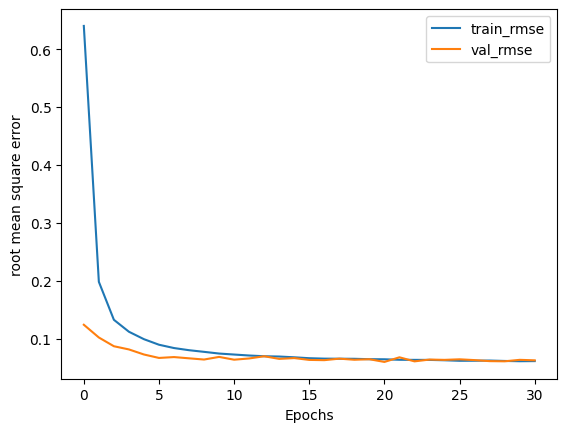

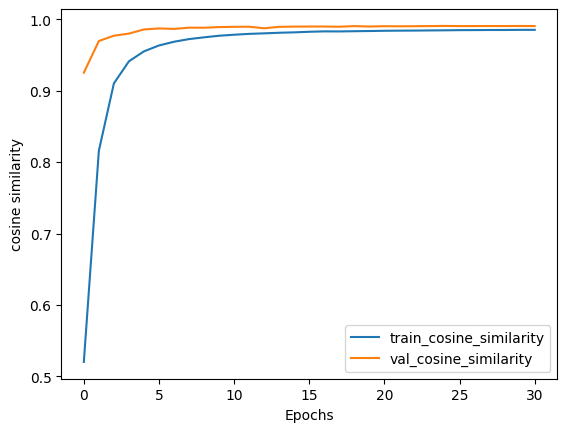

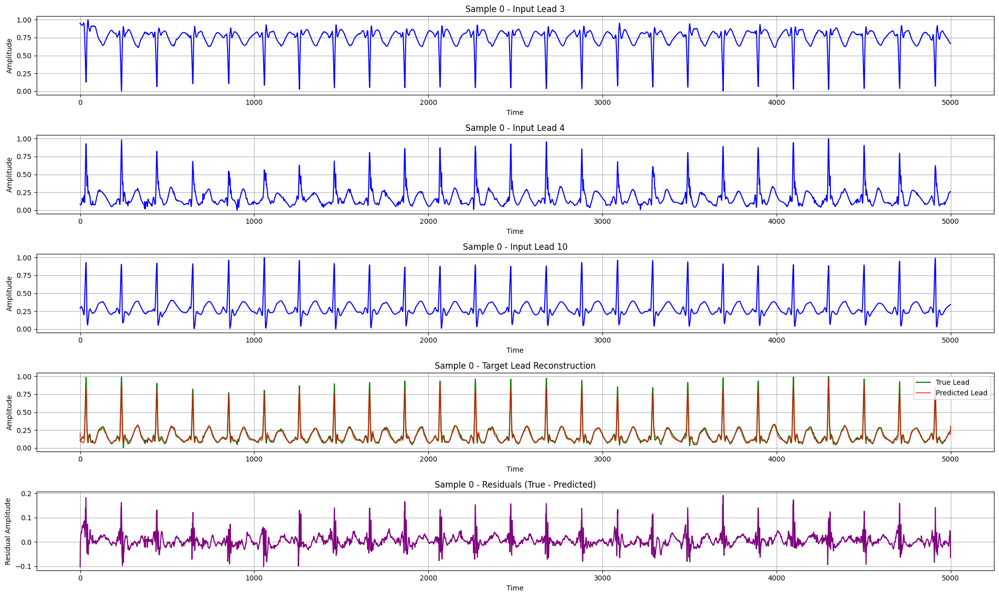

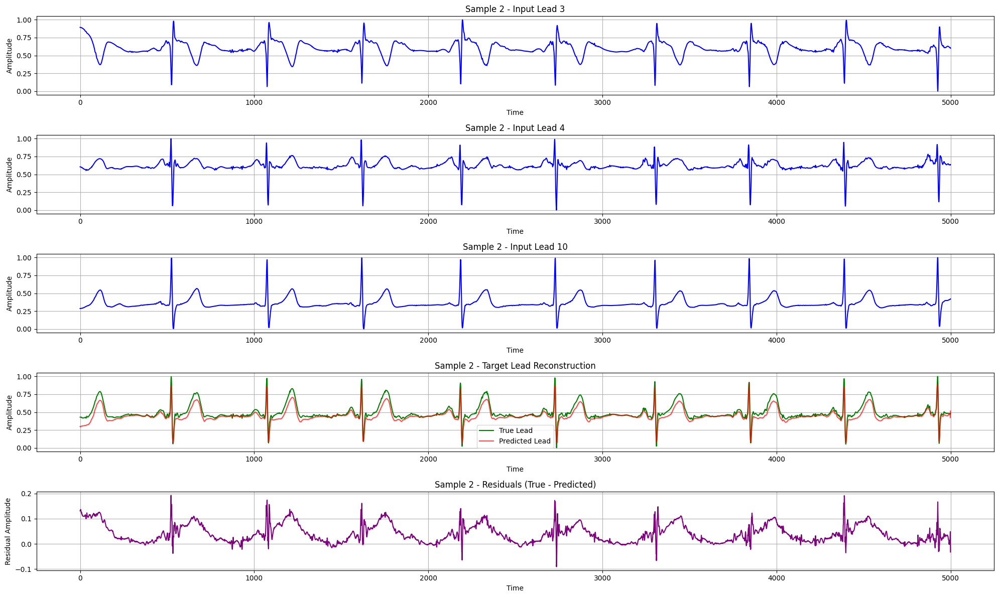

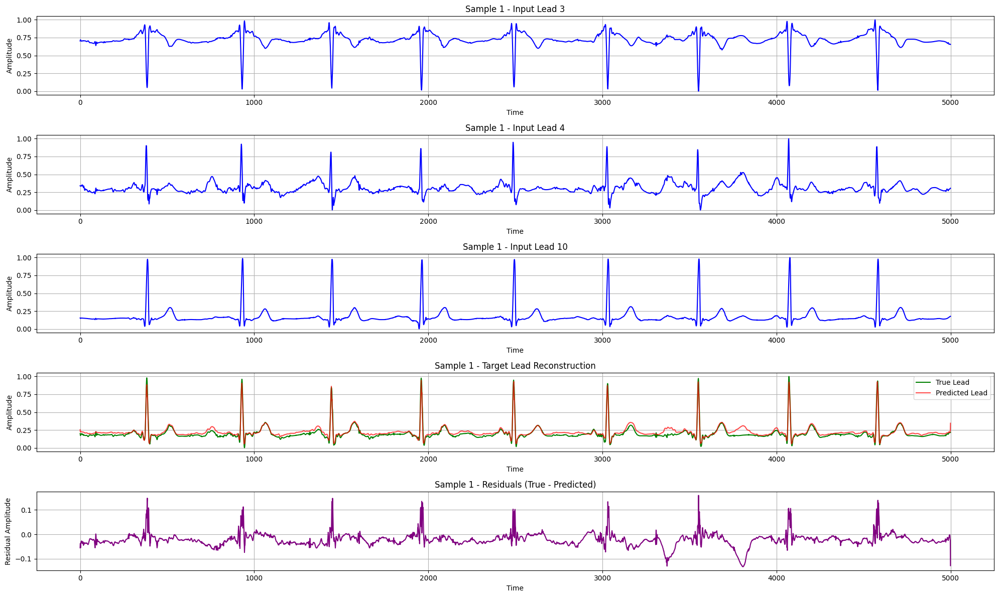

22/22 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step


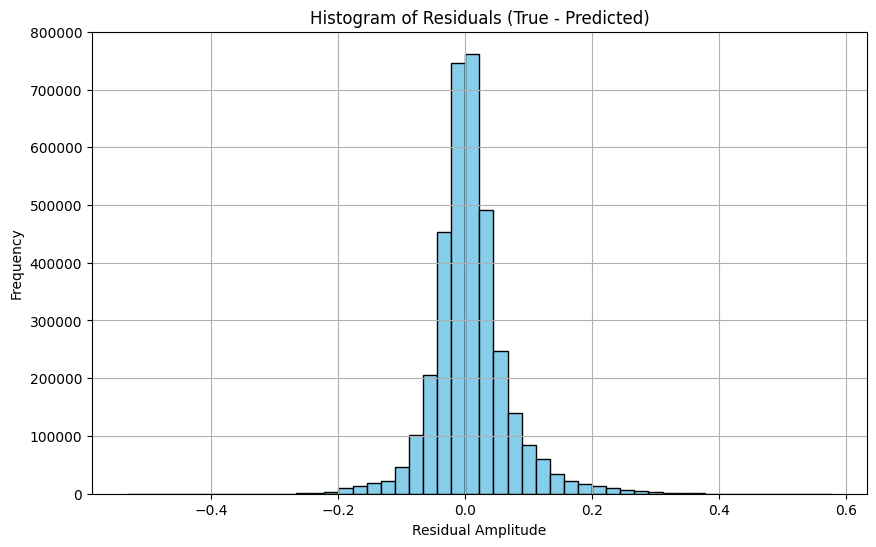

In [16]:
target_lead = 0
input_leads = [3, 4, 10]
handle_lead_model(target_lead, input_leads)

## Lead 2

X_train shape: (3986, 5000, 3)
y_train shape: (3986, 5000, 1)
X_val shape:   (704, 5000, 3)
y_val shape:   (704, 5000, 1)
Epoch 1/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 71s 78ms/step - cosine_similarity: 0.2547 - loss: 0.8687 - rmse: 0.9280 - val_cosine_similarity: 0.9210 - val_loss: 0.1235 - val_rmse: 0.1154 - learning_rate: 1.0000e-04
Epoch 2/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.7477 - loss: 0.2375 - rmse: 0.2294 - val_cosine_similarity: 0.9702 - val_loss: 0.0829 - val_rmse: 0.0750 - learning_rate: 1.0000e-04
Epoch 3/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.8723 - loss: 0.1557 - rmse: 0.1472 - val_cosine_similarity: 0.9776 - val_loss: 0.0767 - val_rmse: 0.0689 - learning_rate: 1.0000e-04
Epoch 4/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - cosine_similarity: 0.9231 - loss: 0.1244 - rmse: 0.1162 - val_cosine_similarity: 0.9818 - val_loss: 0.0699 - val_rmse: 0.0619 - learning_rate: 1.0000e-04
Epoch 5/100
499/499 ━━━━━━━━━━━━━━

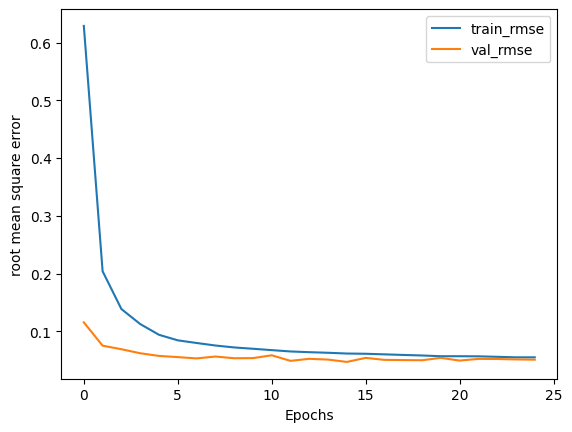

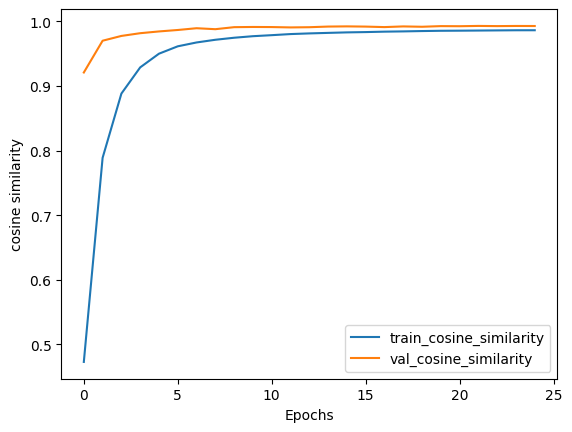

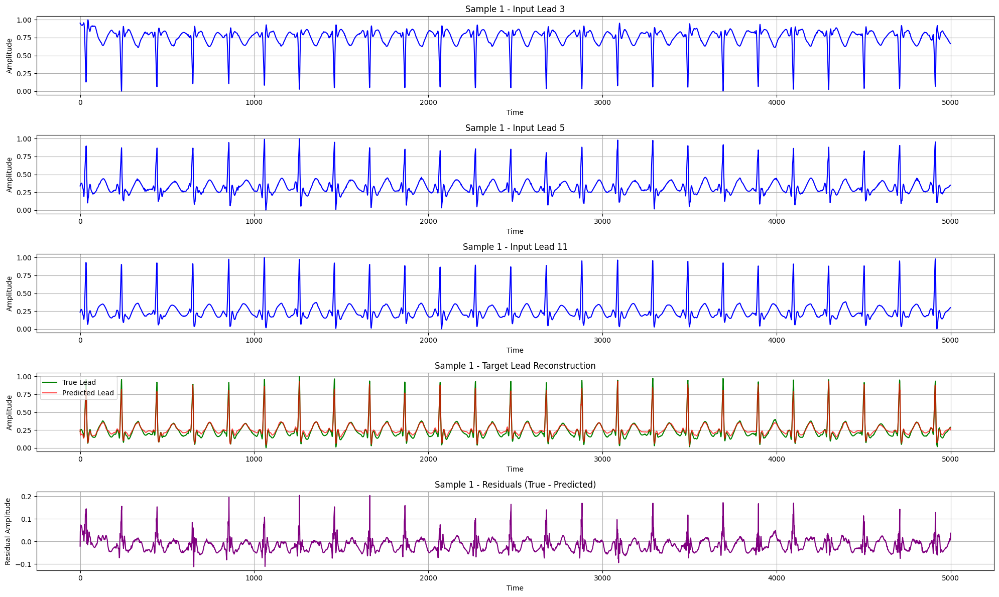

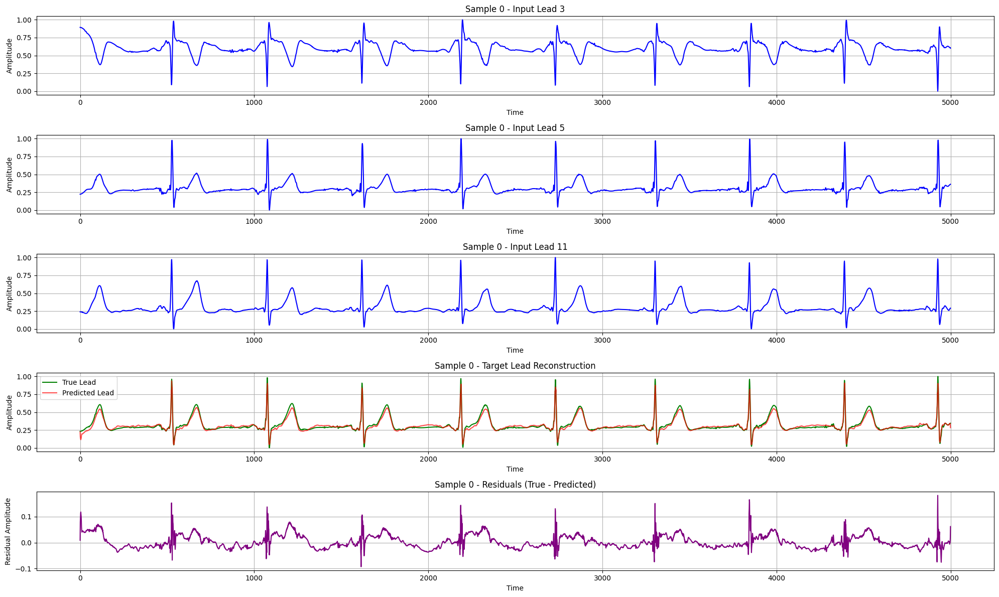

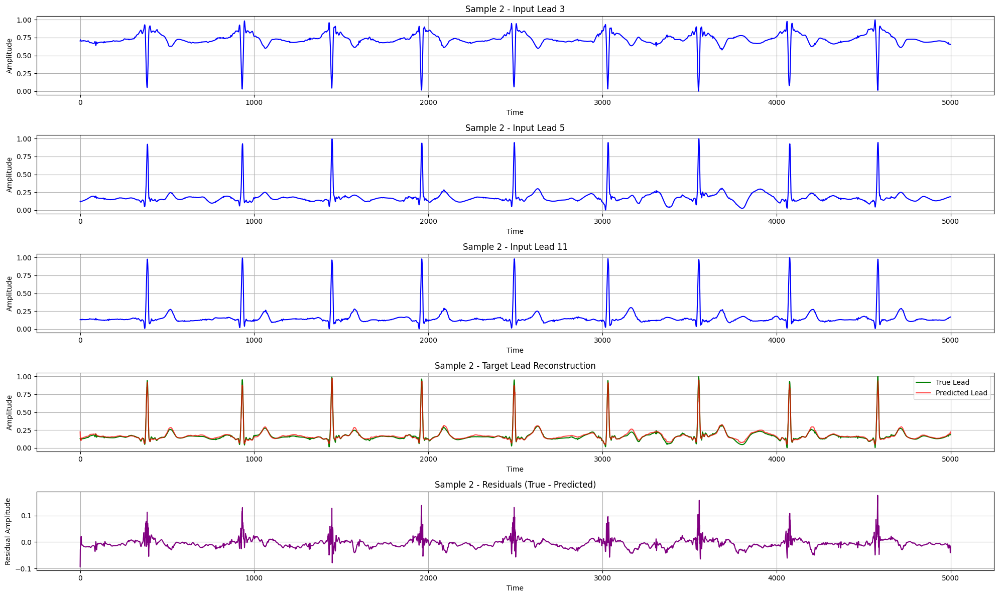

22/22 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step


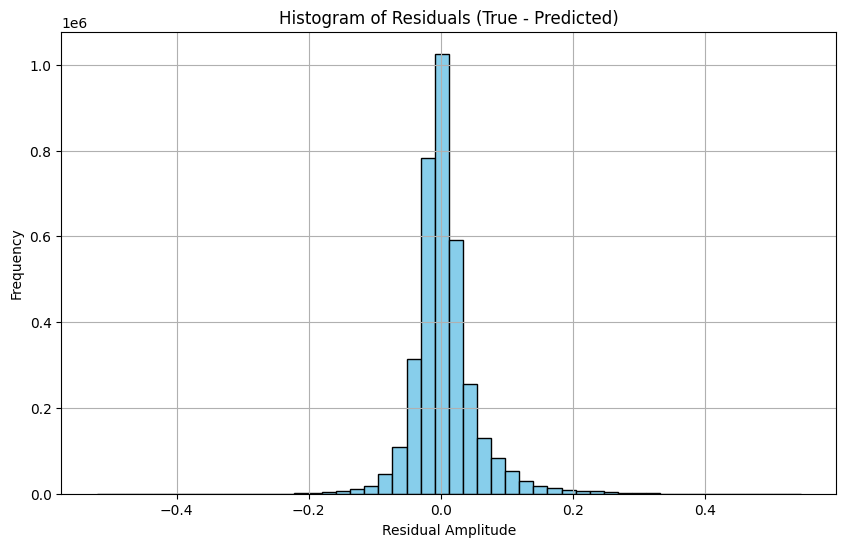

In [17]:
target_lead = 1
input_leads = [3, 5, 11]
handle_lead_model(target_lead, input_leads)

## Lead 3

X_train shape: (3986, 5000, 3)
y_train shape: (3986, 5000, 1)
X_val shape:   (704, 5000, 3)
y_val shape:   (704, 5000, 1)
Epoch 1/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 72s 79ms/step - cosine_similarity: 0.3880 - loss: 0.8216 - rmse: 0.8620 - val_cosine_similarity: 0.9458 - val_loss: 0.1443 - val_rmse: 0.1364 - learning_rate: 1.0000e-04
Epoch 2/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.7870 - loss: 0.2954 - rmse: 0.2870 - val_cosine_similarity: 0.9744 - val_loss: 0.1065 - val_rmse: 0.0991 - learning_rate: 1.0000e-04
Epoch 3/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.8658 - loss: 0.2185 - rmse: 0.2100 - val_cosine_similarity: 0.9830 - val_loss: 0.0972 - val_rmse: 0.0898 - learning_rate: 1.0000e-04
Epoch 4/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - cosine_similarity: 0.9028 - loss: 0.1805 - rmse: 0.1720 - val_cosine_similarity: 0.9760 - val_loss: 0.1028 - val_rmse: 0.0958 - learning_rate: 1.0000e-04
Epoch 5/100
499/499 ━━━━━━━━━━━━━━

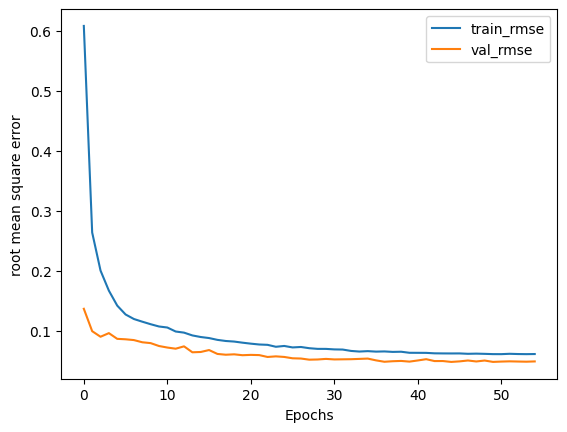

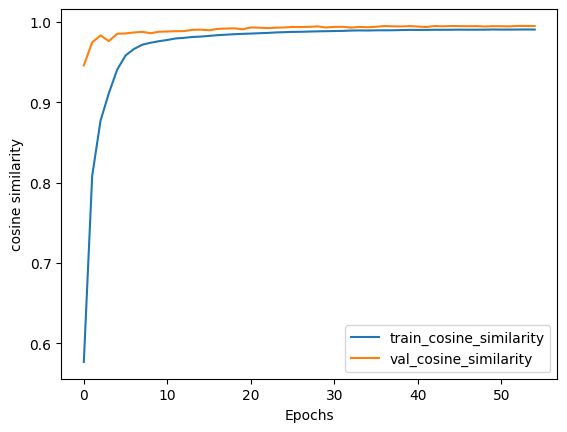

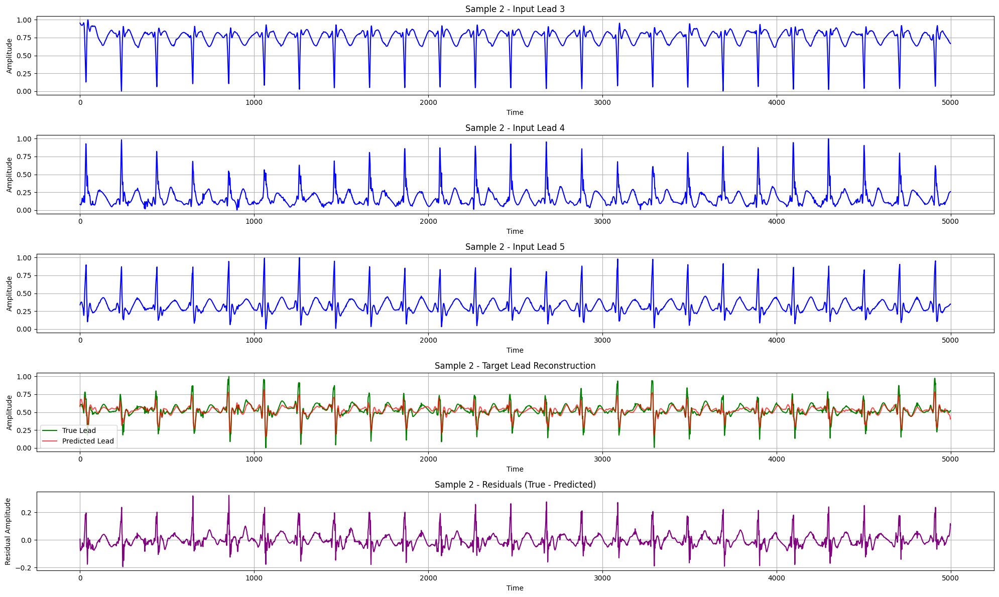

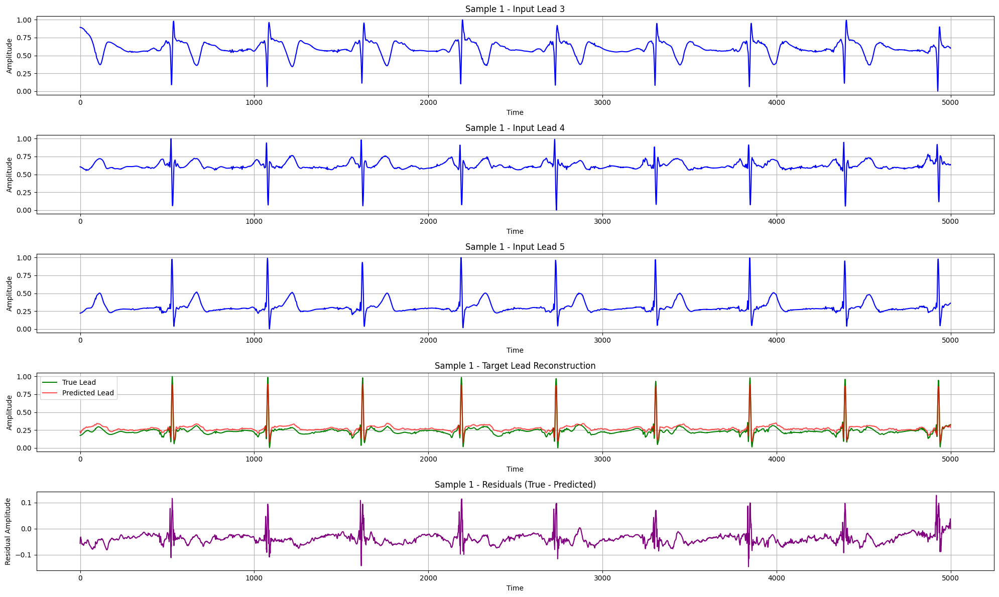

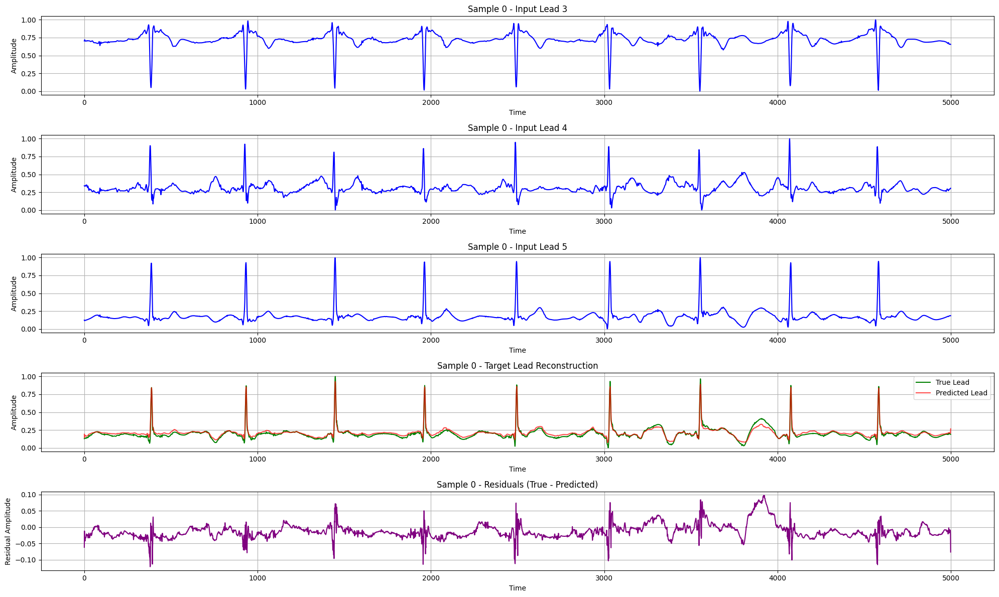

22/22 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step


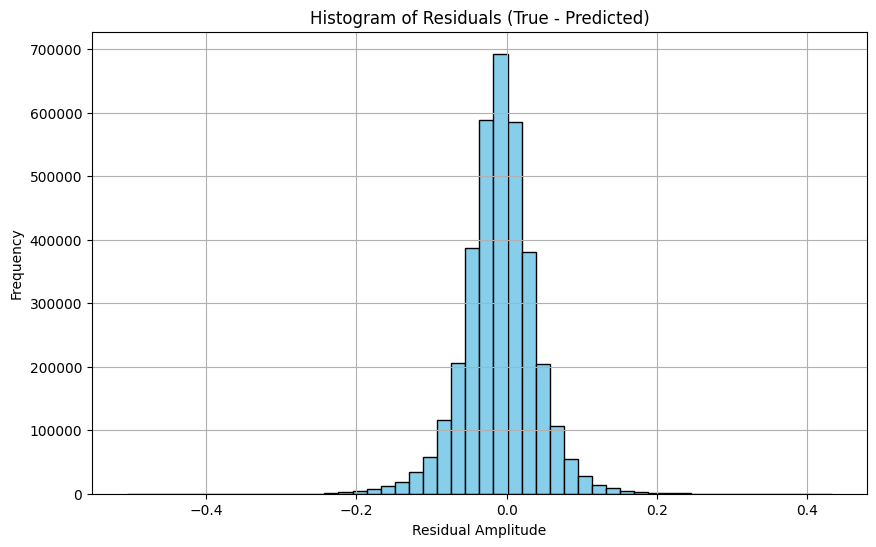

In [18]:
target_lead = 2
input_leads = [3, 4, 5]
handle_lead_model(target_lead, input_leads)

## Lead 4

X_train shape: (3986, 5000, 3)
y_train shape: (3986, 5000, 1)
X_val shape:   (704, 5000, 3)
y_val shape:   (704, 5000, 1)
Epoch 1/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 74s 83ms/step - cosine_similarity: 0.2275 - loss: 1.0795 - rmse: 1.1723 - val_cosine_similarity: 0.9842 - val_loss: 0.1667 - val_rmse: 0.1590 - learning_rate: 1.0000e-04
Epoch 2/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.8816 - loss: 0.3690 - rmse: 0.3601 - val_cosine_similarity: 0.9923 - val_loss: 0.1191 - val_rmse: 0.1106 - learning_rate: 1.0000e-04
Epoch 3/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.9284 - loss: 0.2841 - rmse: 0.2749 - val_cosine_similarity: 0.9949 - val_loss: 0.1106 - val_rmse: 0.1025 - learning_rate: 1.0000e-04
Epoch 4/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.9516 - loss: 0.2351 - rmse: 0.2261 - val_cosine_similarity: 0.9955 - val_loss: 0.1071 - val_rmse: 0.0988 - learning_rate: 1.0000e-04
Epoch 5/100
499/499 ━━━━━━━━━━━━━━

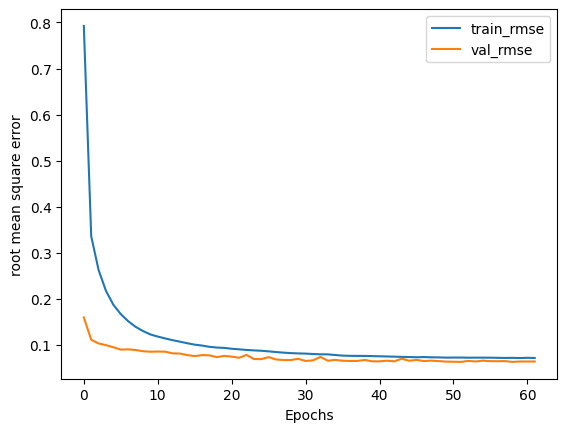

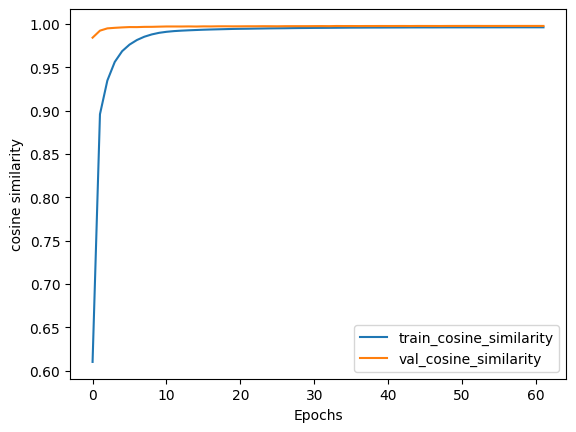

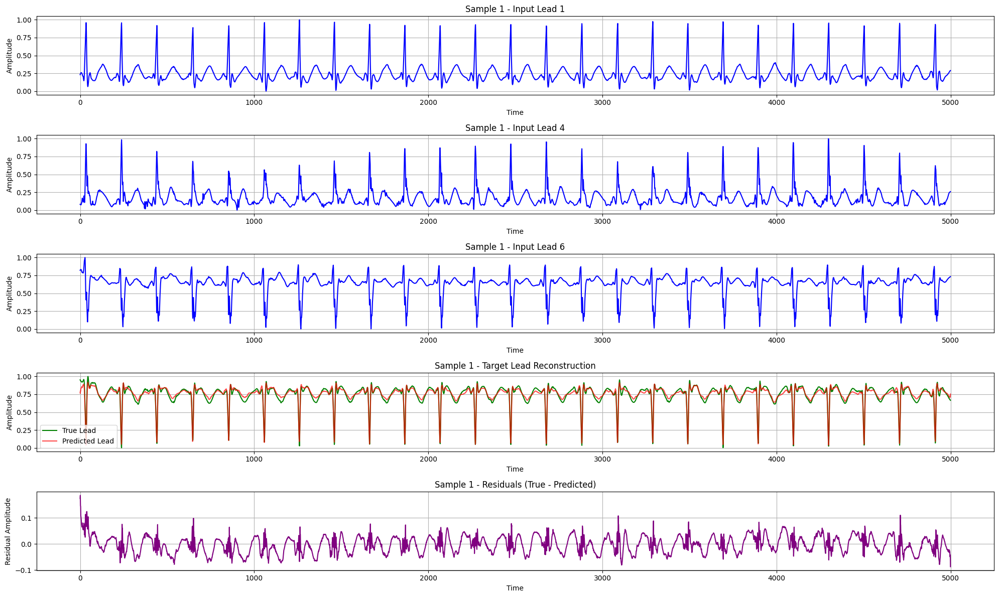

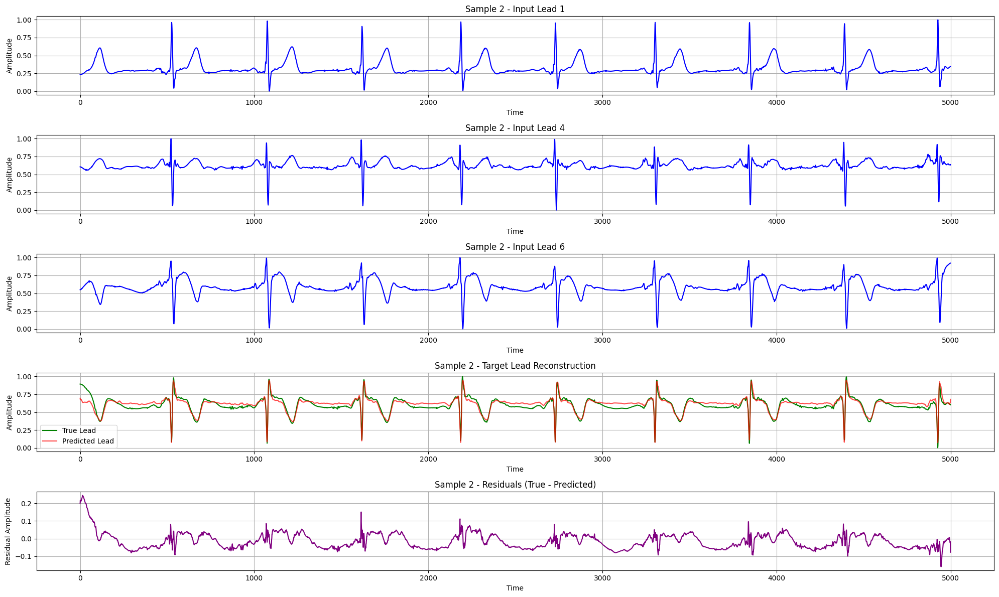

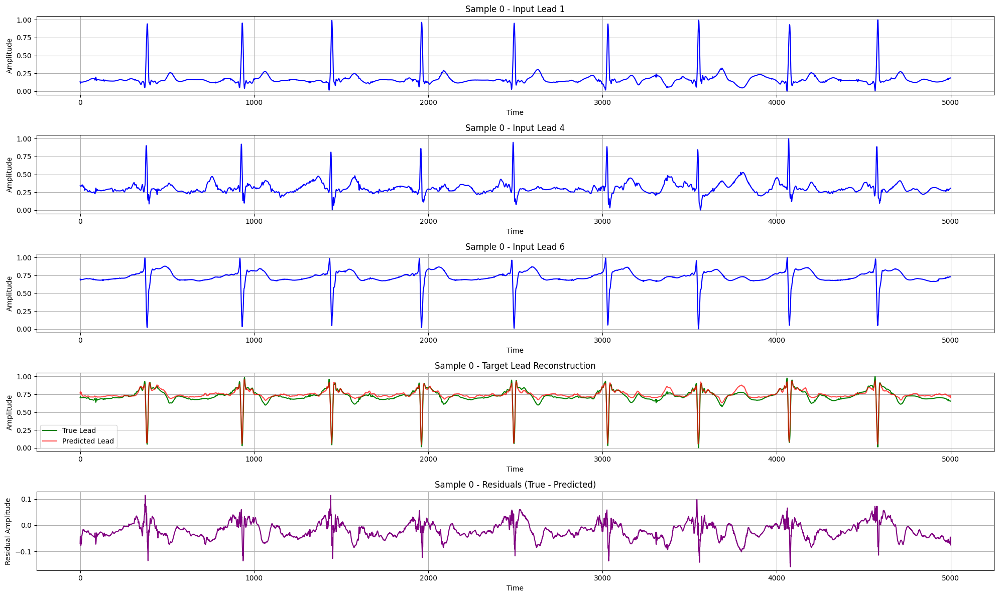

22/22 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step


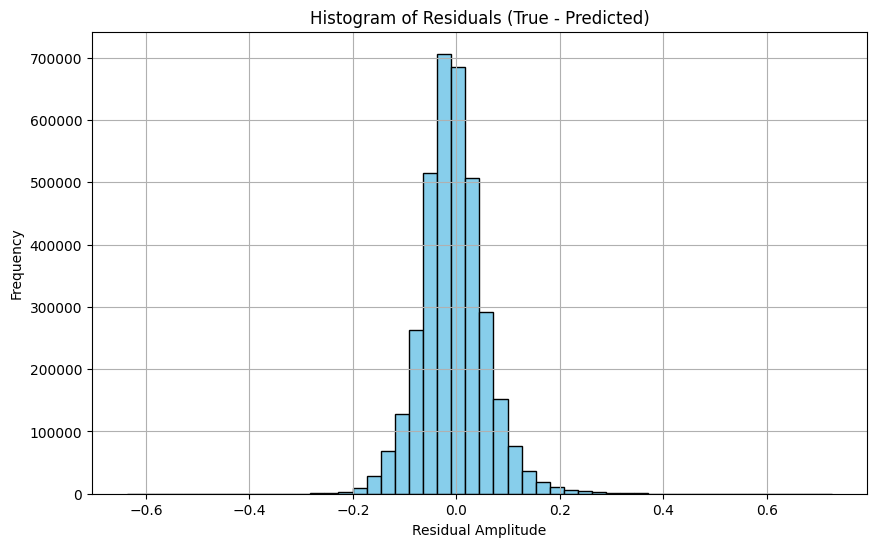

In [19]:
target_lead = 3
input_leads = [1, 4, 6]
handle_lead_model(target_lead, input_leads)

## Lead 5

X_train shape: (3986, 5000, 3)
y_train shape: (3986, 5000, 1)
X_val shape:   (704, 5000, 3)
y_val shape:   (704, 5000, 1)
Epoch 1/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 72s 79ms/step - cosine_similarity: 0.5125 - loss: 0.6636 - rmse: 0.6858 - val_cosine_similarity: 0.9517 - val_loss: 0.1603 - val_rmse: 0.1528 - learning_rate: 1.0000e-04
Epoch 2/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.8117 - loss: 0.2686 - rmse: 0.2601 - val_cosine_similarity: 0.9803 - val_loss: 0.1069 - val_rmse: 0.1001 - learning_rate: 1.0000e-04
Epoch 3/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.8921 - loss: 0.2015 - rmse: 0.1933 - val_cosine_similarity: 0.9833 - val_loss: 0.1042 - val_rmse: 0.0978 - learning_rate: 1.0000e-04
Epoch 4/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.9258 - loss: 0.1703 - rmse: 0.1626 - val_cosine_similarity: 0.9831 - val_loss: 0.1038 - val_rmse: 0.0972 - learning_rate: 1.0000e-04
Epoch 5/100
499/499 ━━━━━━━━━━━━━━

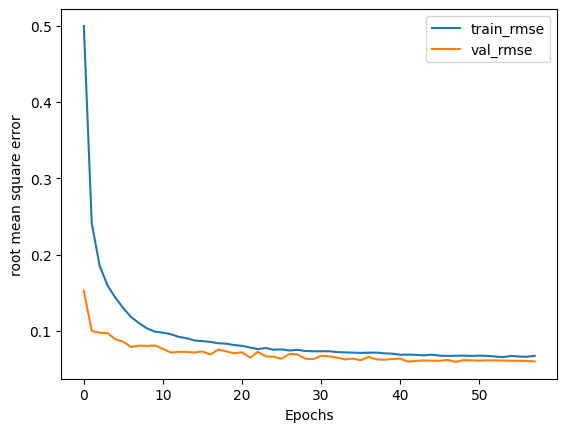

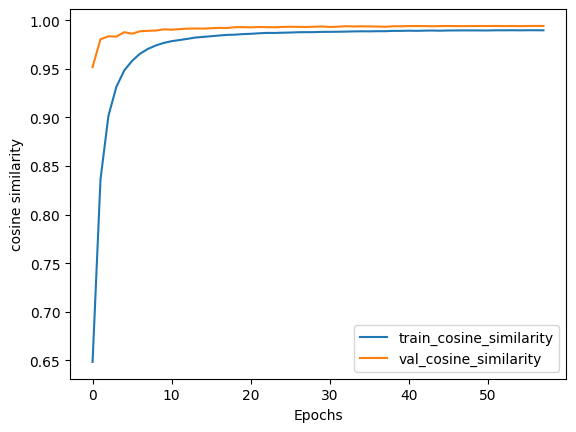

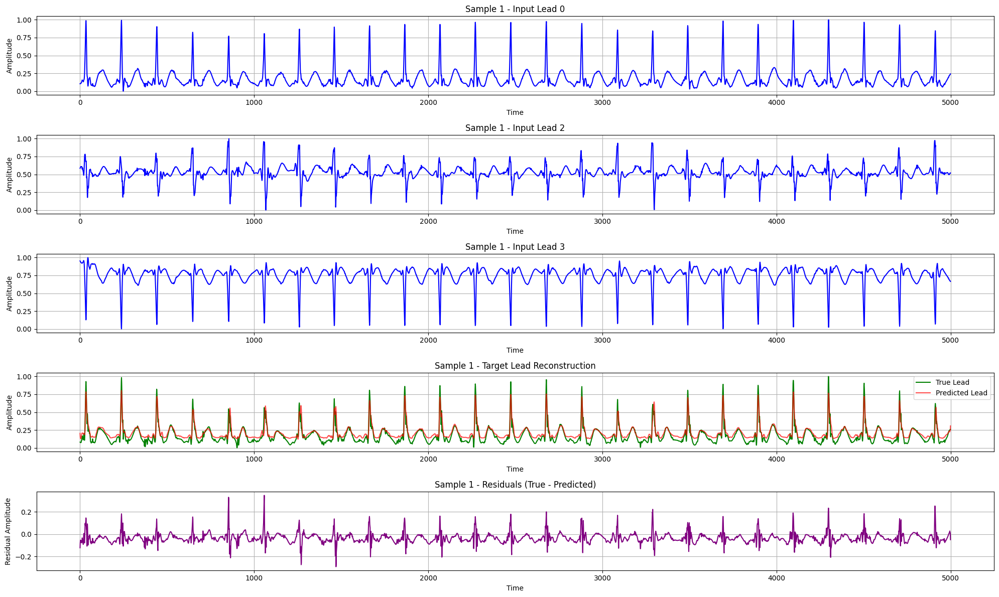

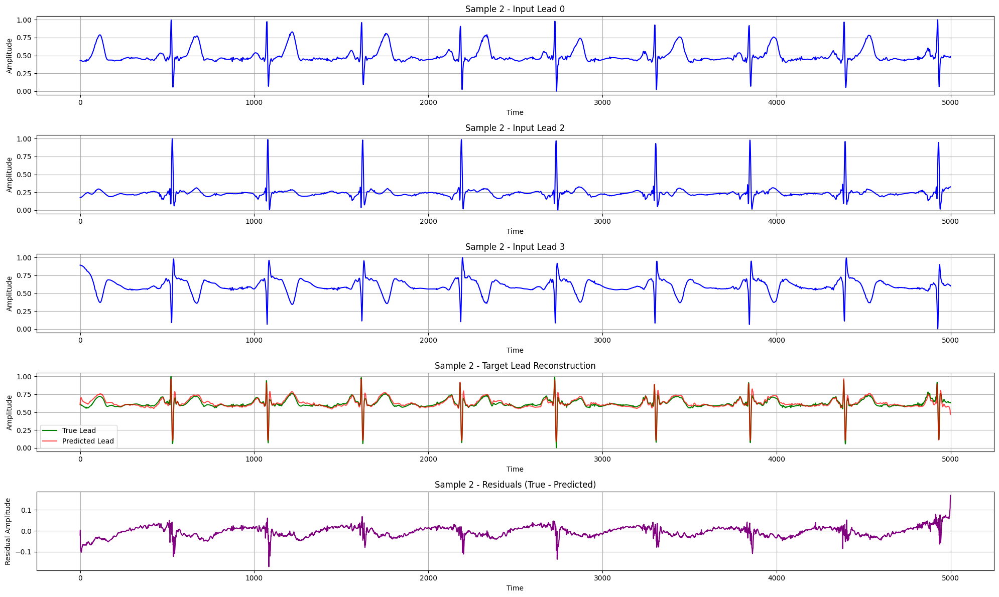

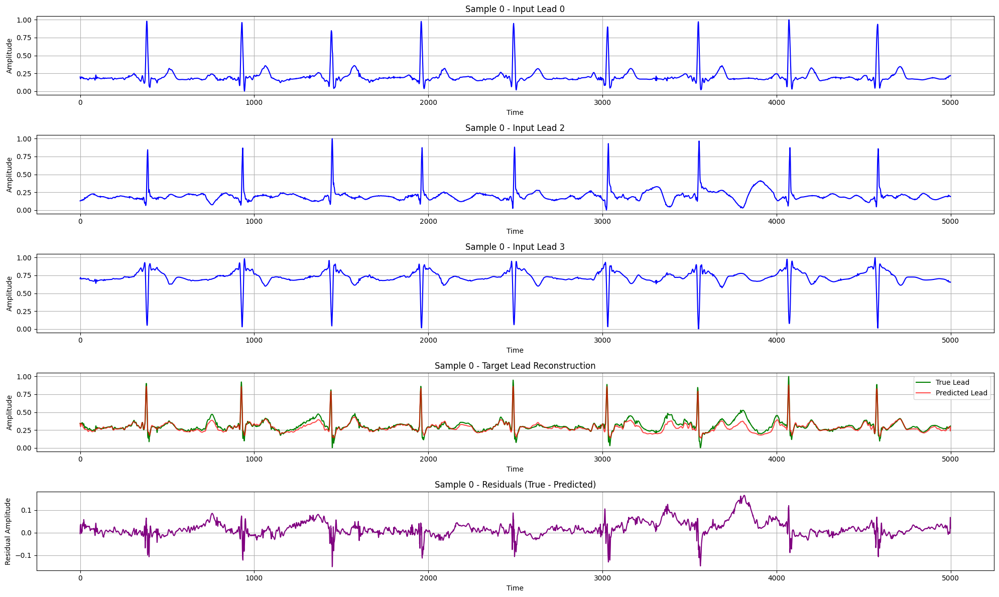

22/22 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step


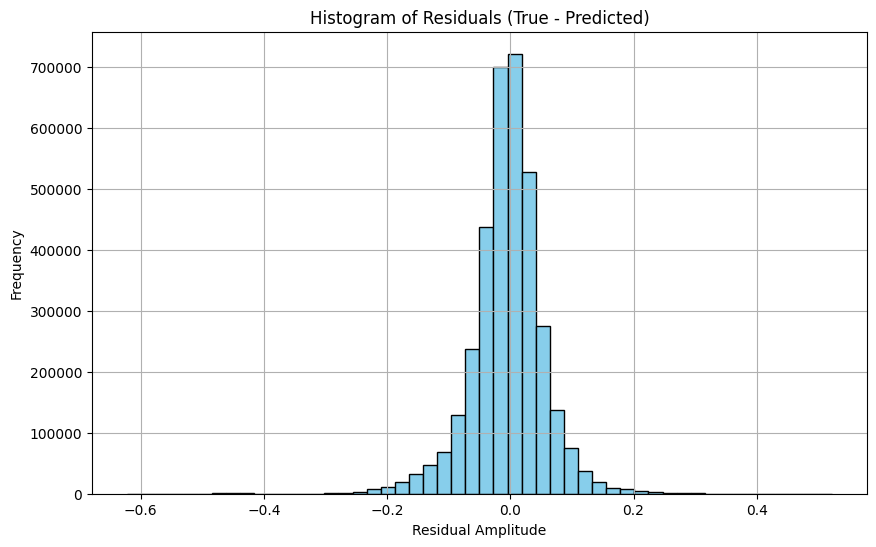

In [20]:
target_lead = 4
input_leads = [0, 2, 3]
handle_lead_model(target_lead, input_leads)

## Lead 6

X_train shape: (3986, 5000, 3)
y_train shape: (3986, 5000, 1)
X_val shape:   (704, 5000, 3)
y_val shape:   (704, 5000, 1)
Epoch 1/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 72s 79ms/step - cosine_similarity: 0.0209 - loss: 1.1347 - rmse: 1.2251 - val_cosine_similarity: 0.9142 - val_loss: 0.1327 - val_rmse: 0.1242 - learning_rate: 1.0000e-04
Epoch 2/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.6194 - loss: 0.3807 - rmse: 0.3718 - val_cosine_similarity: 0.9593 - val_loss: 0.1033 - val_rmse: 0.0959 - learning_rate: 1.0000e-04
Epoch 3/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.7224 - loss: 0.2871 - rmse: 0.2781 - val_cosine_similarity: 0.9642 - val_loss: 0.1152 - val_rmse: 0.1092 - learning_rate: 1.0000e-04
Epoch 4/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.8151 - loss: 0.2132 - rmse: 0.2047 - val_cosine_similarity: 0.9756 - val_loss: 0.0888 - val_rmse: 0.0817 - learning_rate: 1.0000e-04
Epoch 5/100
499/499 ━━━━━━━━━━━━━━

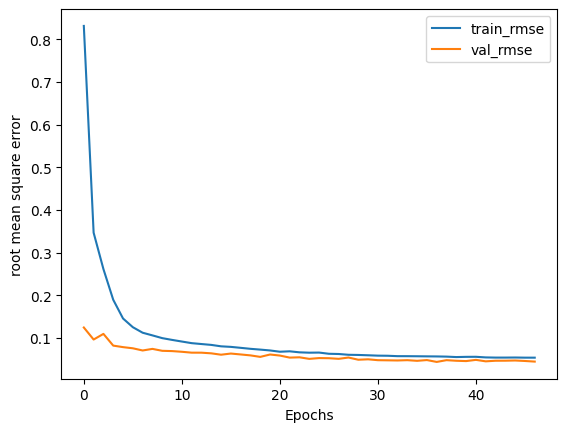

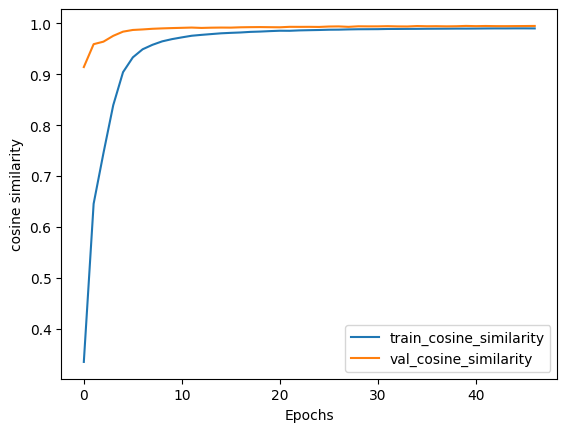

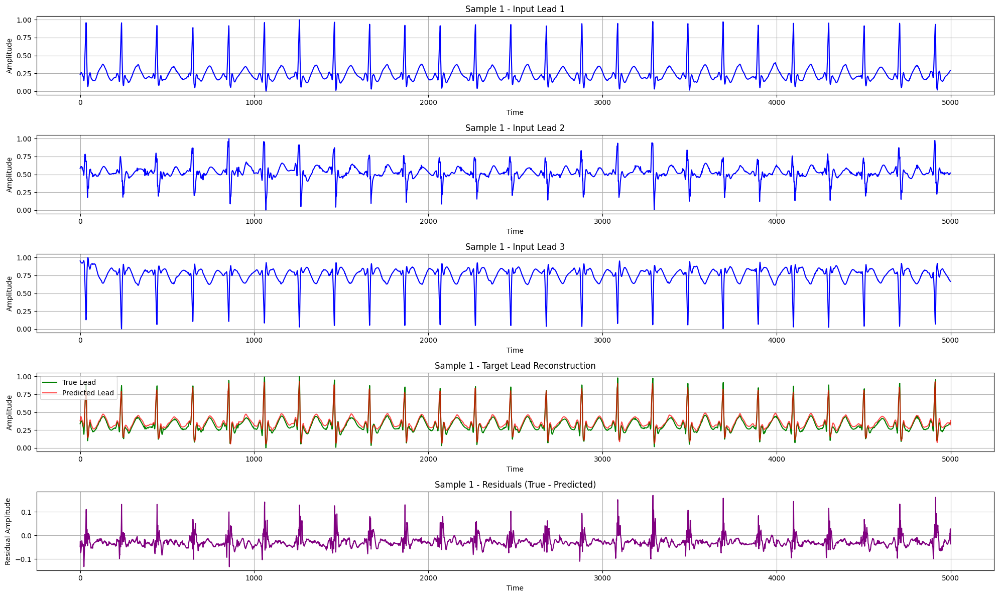

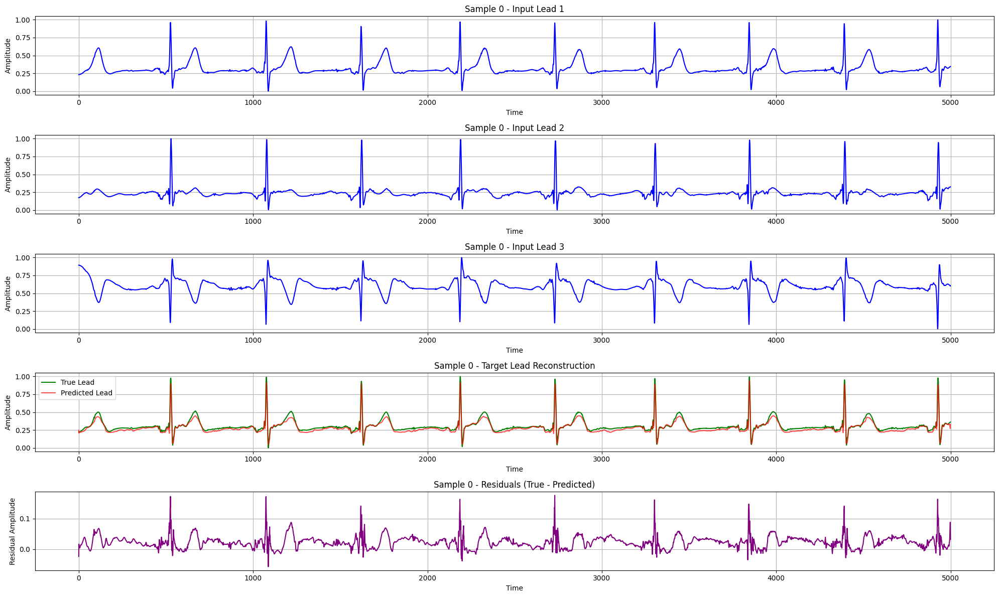

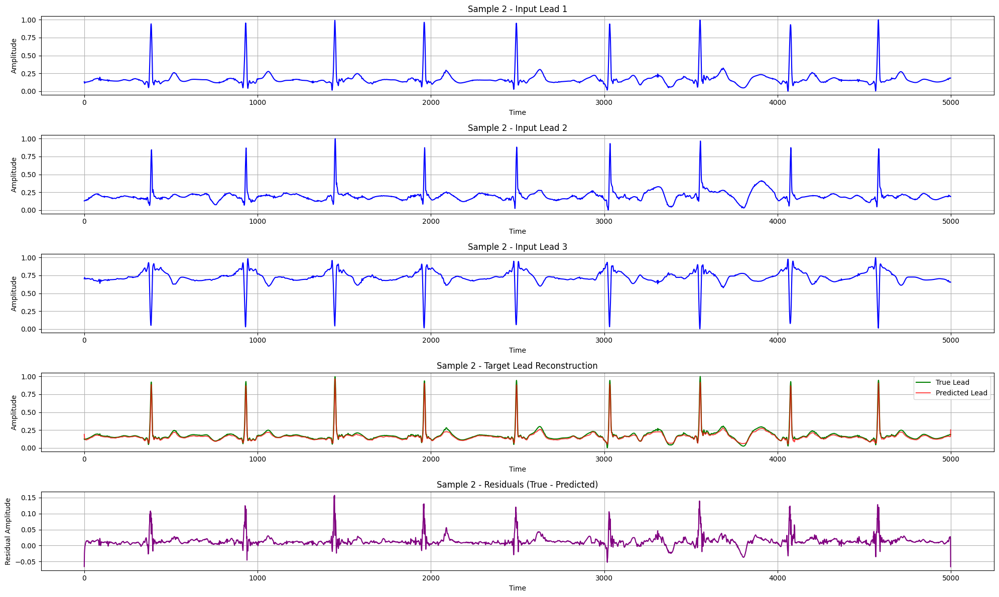

22/22 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step


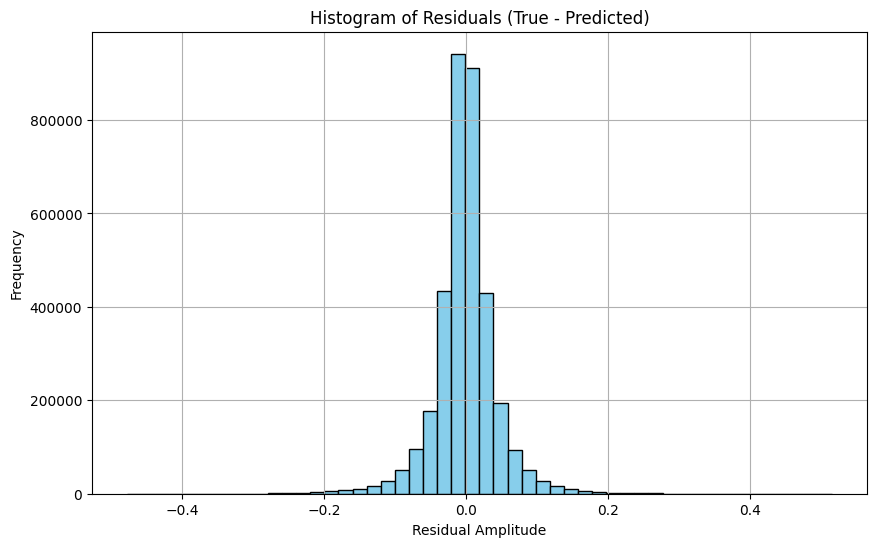

In [21]:
target_lead = 5
input_leads = [1, 2, 3]
handle_lead_model(target_lead, input_leads)

## Lead 7

X_train shape: (3986, 5000, 3)
y_train shape: (3986, 5000, 1)
X_val shape:   (704, 5000, 3)
y_val shape:   (704, 5000, 1)
Epoch 1/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 72s 78ms/step - cosine_similarity: 0.4772 - loss: 0.7885 - rmse: 0.8316 - val_cosine_similarity: 0.9824 - val_loss: 0.1513 - val_rmse: 0.1439 - learning_rate: 1.0000e-04
Epoch 2/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.9083 - loss: 0.2892 - rmse: 0.2806 - val_cosine_similarity: 0.9858 - val_loss: 0.1325 - val_rmse: 0.1258 - learning_rate: 1.0000e-04
Epoch 3/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.9458 - loss: 0.2265 - rmse: 0.2180 - val_cosine_similarity: 0.9878 - val_loss: 0.1275 - val_rmse: 0.1209 - learning_rate: 1.0000e-04
Epoch 4/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.9625 - loss: 0.1965 - rmse: 0.1882 - val_cosine_similarity: 0.9887 - val_loss: 0.1230 - val_rmse: 0.1164 - learning_rate: 1.0000e-04
Epoch 5/100
499/499 ━━━━━━━━━━━━━━

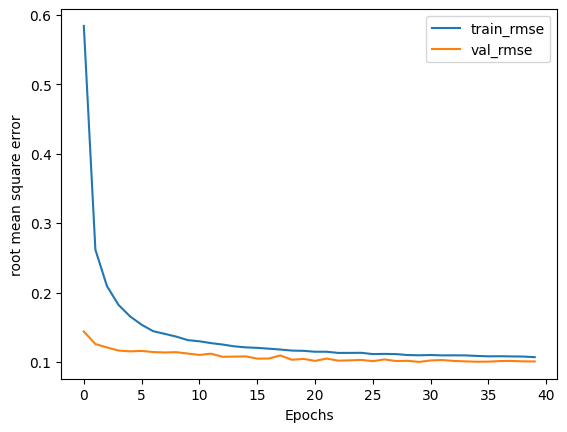

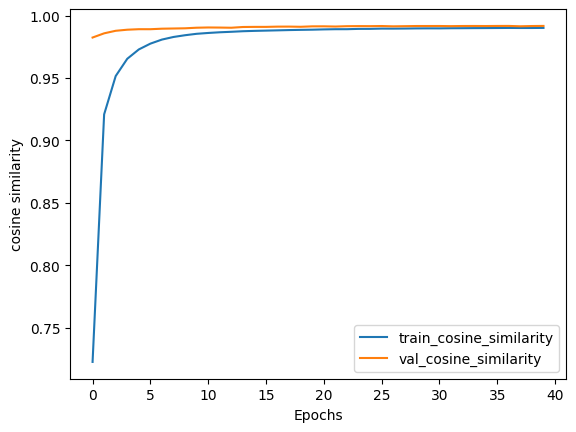

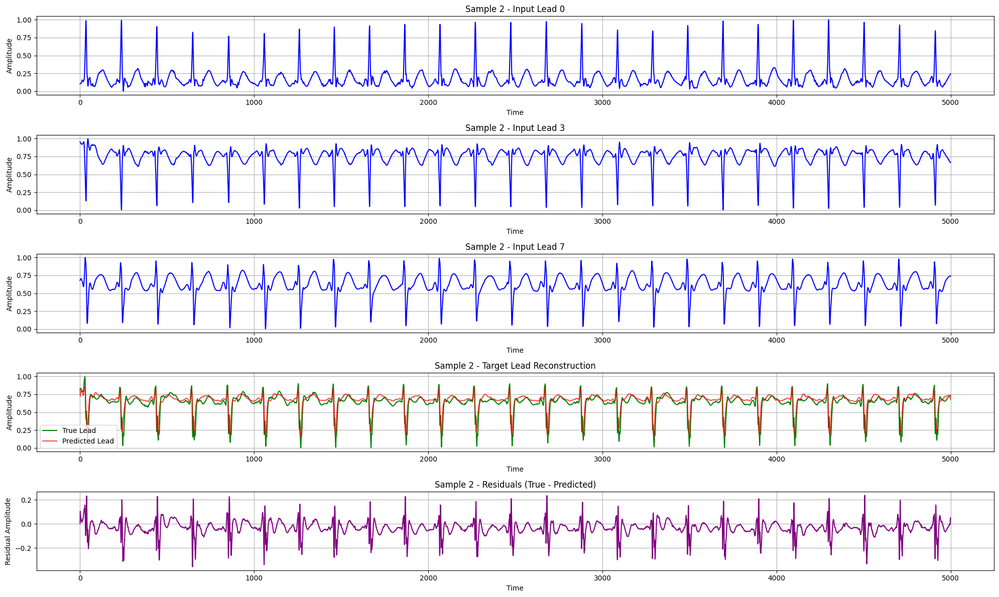

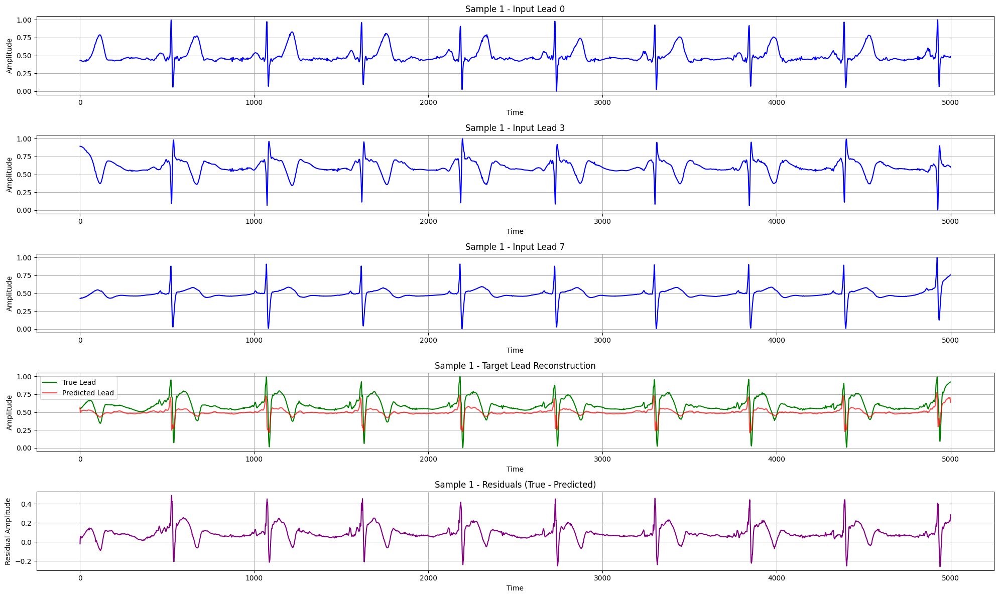

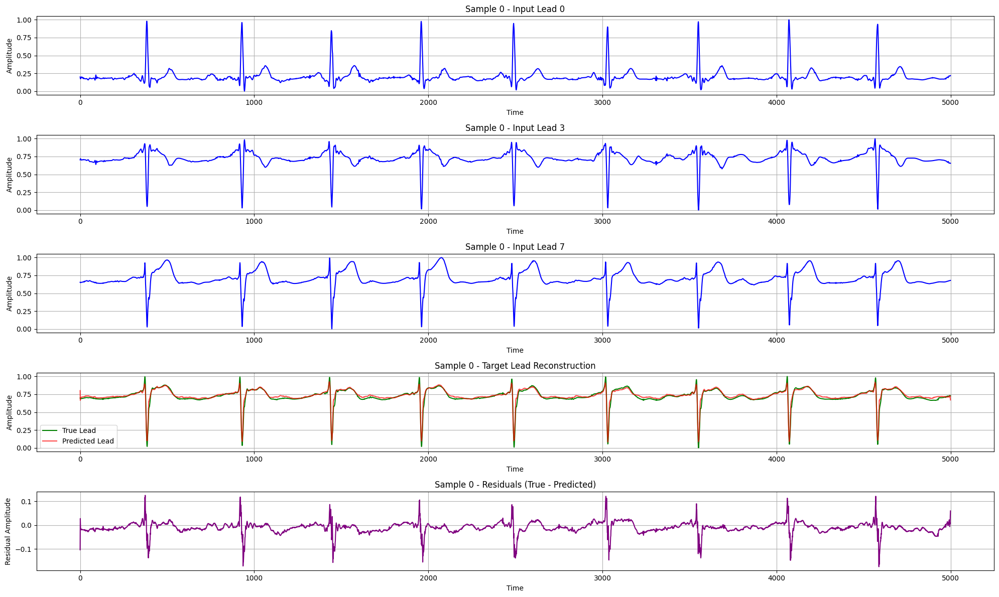

22/22 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step


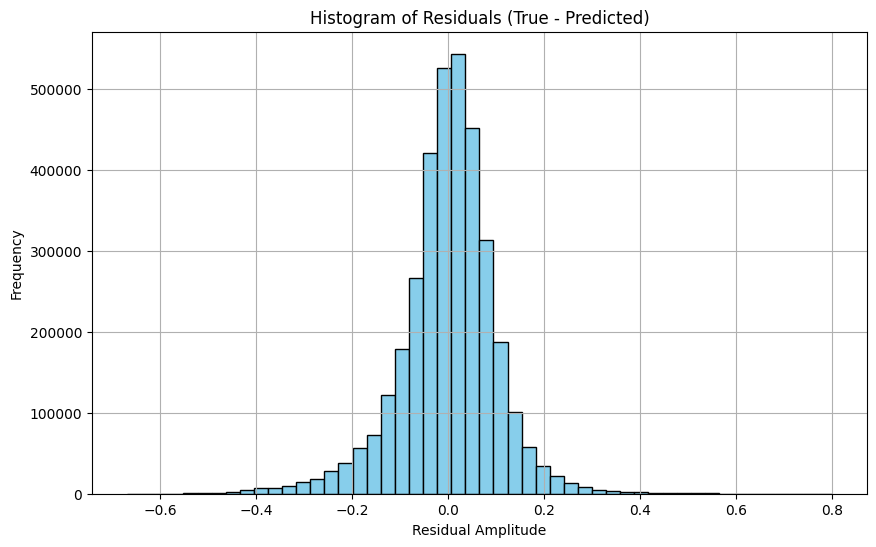

In [22]:
target_lead = 6
input_leads = [0, 3, 7]
handle_lead_model(target_lead, input_leads)

## Lead 8

X_train shape: (3986, 5000, 3)
y_train shape: (3986, 5000, 1)
X_val shape:   (704, 5000, 3)
y_val shape:   (704, 5000, 1)
Epoch 1/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 74s 82ms/step - cosine_similarity: 0.1607 - loss: 1.1864 - rmse: 1.2936 - val_cosine_similarity: 0.9708 - val_loss: 0.1954 - val_rmse: 0.1889 - learning_rate: 1.0000e-04
Epoch 2/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - cosine_similarity: 0.8313 - loss: 0.3839 - rmse: 0.3752 - val_cosine_similarity: 0.9880 - val_loss: 0.1189 - val_rmse: 0.1120 - learning_rate: 1.0000e-04
Epoch 3/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.9007 - loss: 0.2848 - rmse: 0.2757 - val_cosine_similarity: 0.9901 - val_loss: 0.1116 - val_rmse: 0.1045 - learning_rate: 1.0000e-04
Epoch 4/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - cosine_similarity: 0.9339 - loss: 0.2297 - rmse: 0.2207 - val_cosine_similarity: 0.9896 - val_loss: 0.1117 - val_rmse: 0.1045 - learning_rate: 1.0000e-04
Epoch 5/100
499/499 ━━━━━━━━━━━━━━

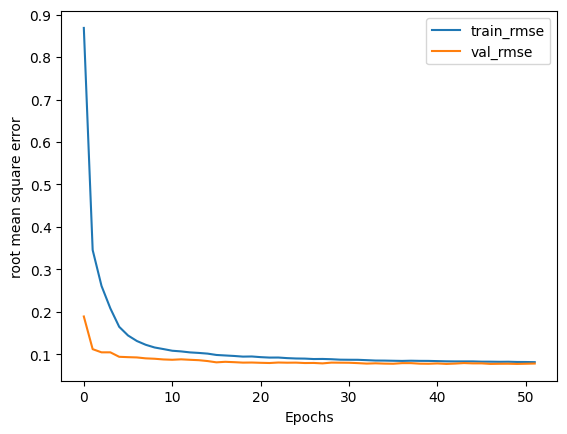

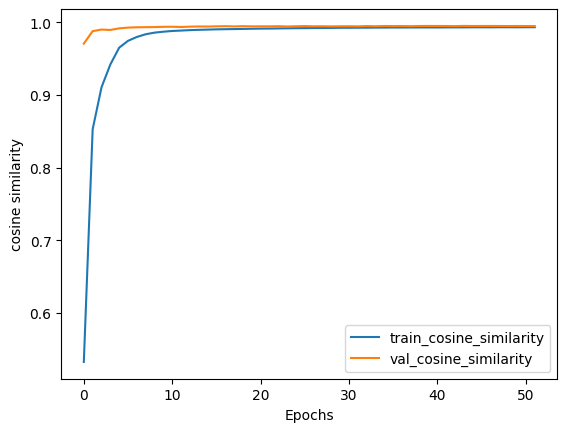

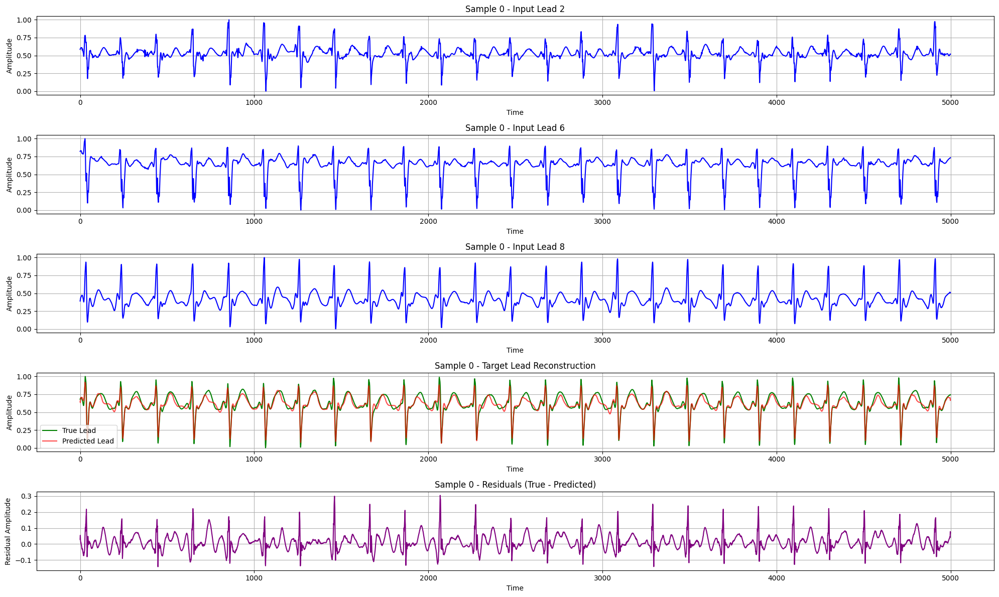

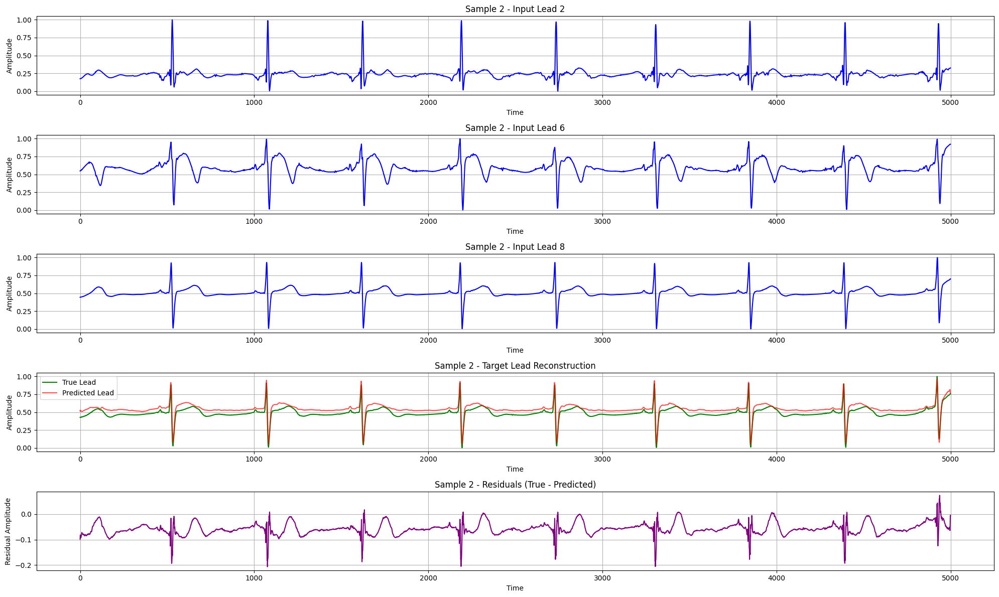

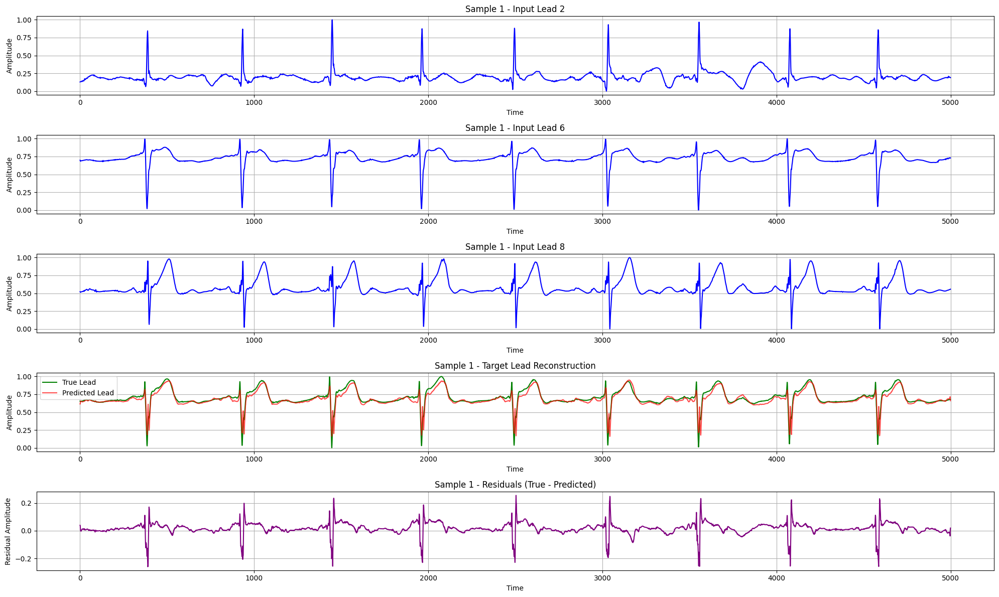

22/22 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step


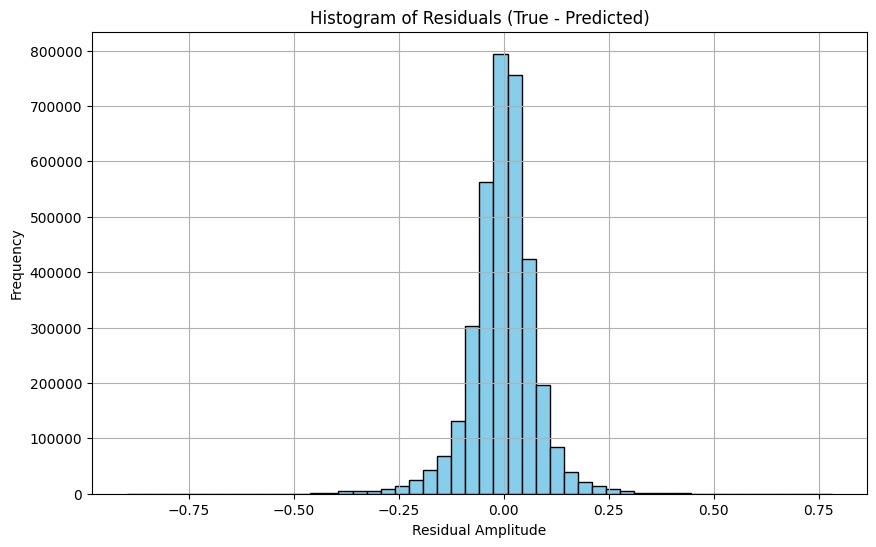

In [23]:
target_lead = 7
input_leads = [2, 6, 8]
handle_lead_model(target_lead, input_leads)

## Lead 9

X_train shape: (3986, 5000, 3)
y_train shape: (3986, 5000, 1)
X_val shape:   (704, 5000, 3)
y_val shape:   (704, 5000, 1)
Epoch 1/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 71s 78ms/step - cosine_similarity: 0.5134 - loss: 0.8150 - rmse: 0.8479 - val_cosine_similarity: 0.9672 - val_loss: 0.1431 - val_rmse: 0.1351 - learning_rate: 1.0000e-04
Epoch 2/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.8631 - loss: 0.2862 - rmse: 0.2776 - val_cosine_similarity: 0.9855 - val_loss: 0.1155 - val_rmse: 0.1086 - learning_rate: 1.0000e-04
Epoch 3/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.9221 - loss: 0.2125 - rmse: 0.2037 - val_cosine_similarity: 0.9883 - val_loss: 0.0996 - val_rmse: 0.0929 - learning_rate: 1.0000e-04
Epoch 4/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.9504 - loss: 0.1763 - rmse: 0.1678 - val_cosine_similarity: 0.9913 - val_loss: 0.0969 - val_rmse: 0.0906 - learning_rate: 1.0000e-04
Epoch 5/100
499/499 ━━━━━━━━━━━━━━

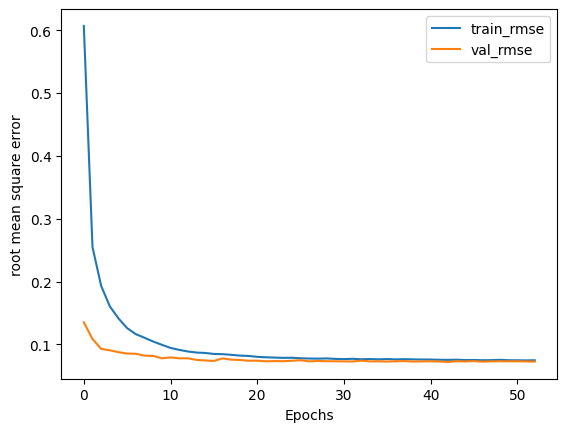

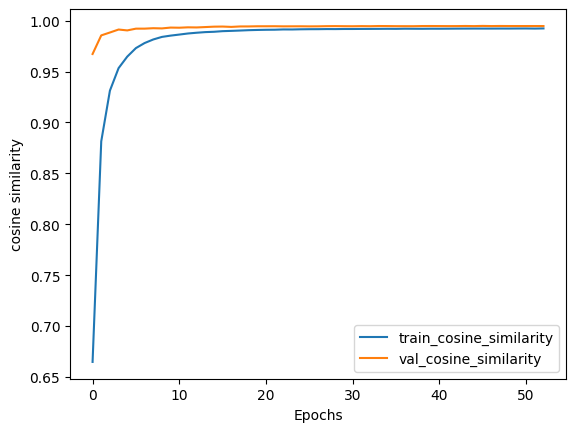

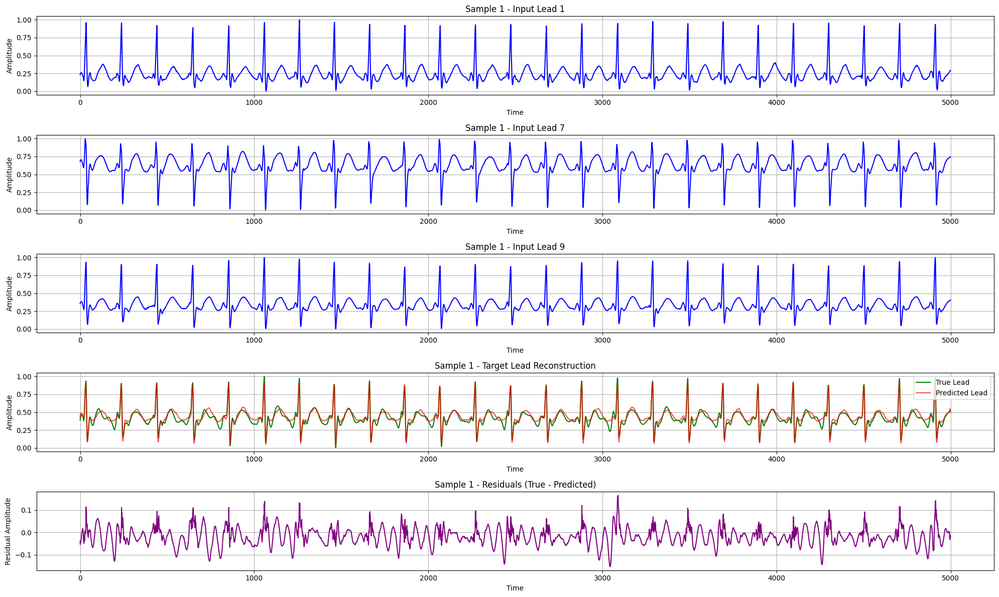

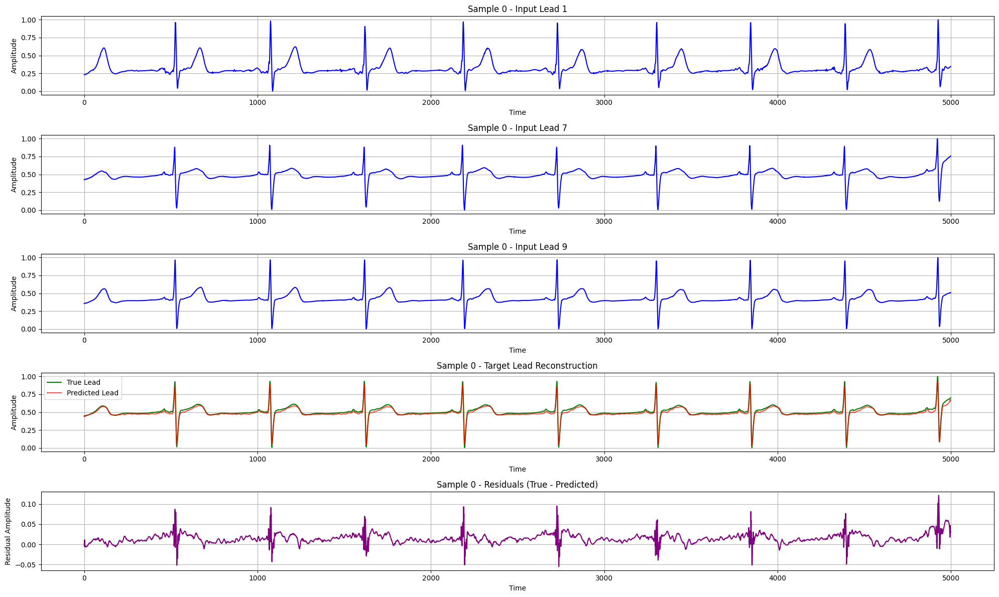

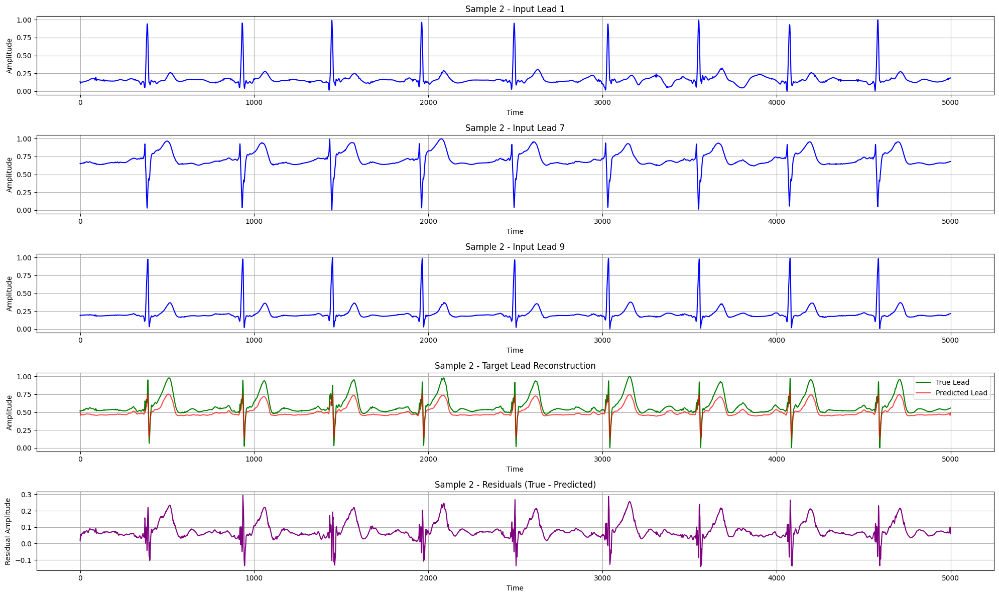

22/22 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step


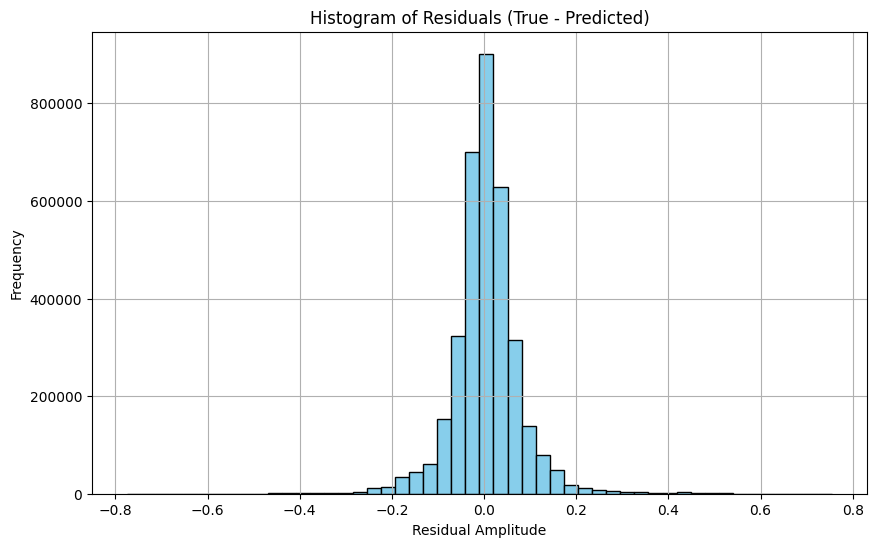

In [24]:
target_lead = 8
input_leads = [1, 7, 9]
handle_lead_model(target_lead, input_leads)

## Lead 10

X_train shape: (3986, 5000, 3)
y_train shape: (3986, 5000, 1)
X_val shape:   (704, 5000, 3)
y_val shape:   (704, 5000, 1)
Epoch 1/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 72s 77ms/step - cosine_similarity: 0.6085 - loss: 0.9730 - rmse: 1.0519 - val_cosine_similarity: 0.9390 - val_loss: 0.1346 - val_rmse: 0.1265 - learning_rate: 1.0000e-04
Epoch 2/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.7940 - loss: 0.2749 - rmse: 0.2668 - val_cosine_similarity: 0.9736 - val_loss: 0.0942 - val_rmse: 0.0866 - learning_rate: 1.0000e-04
Epoch 3/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.9095 - loss: 0.1668 - rmse: 0.1585 - val_cosine_similarity: 0.9868 - val_loss: 0.0772 - val_rmse: 0.0705 - learning_rate: 1.0000e-04
Epoch 4/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.9465 - loss: 0.1302 - rmse: 0.1218 - val_cosine_similarity: 0.9903 - val_loss: 0.0709 - val_rmse: 0.0646 - learning_rate: 1.0000e-04
Epoch 5/100
499/499 ━━━━━━━━━━━━━━

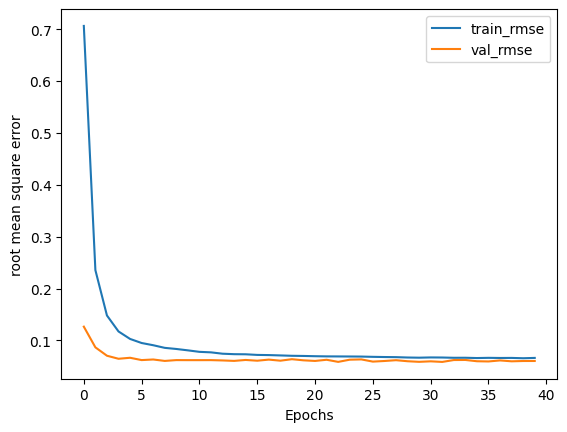

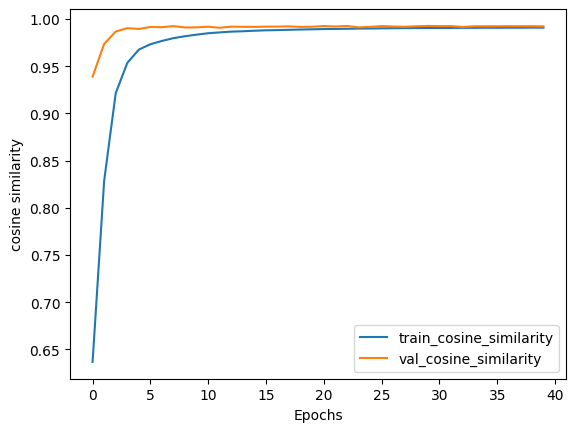

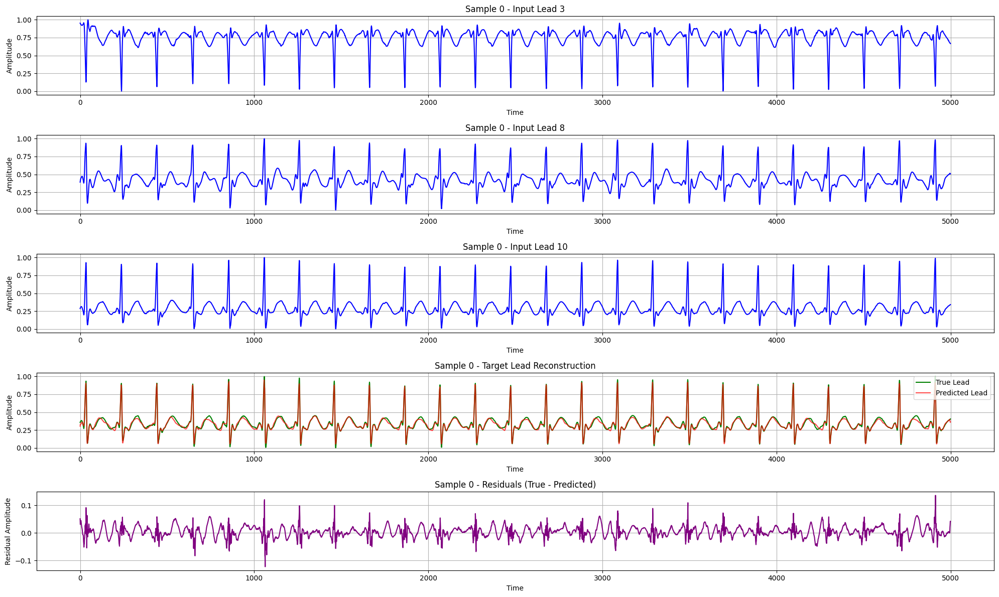

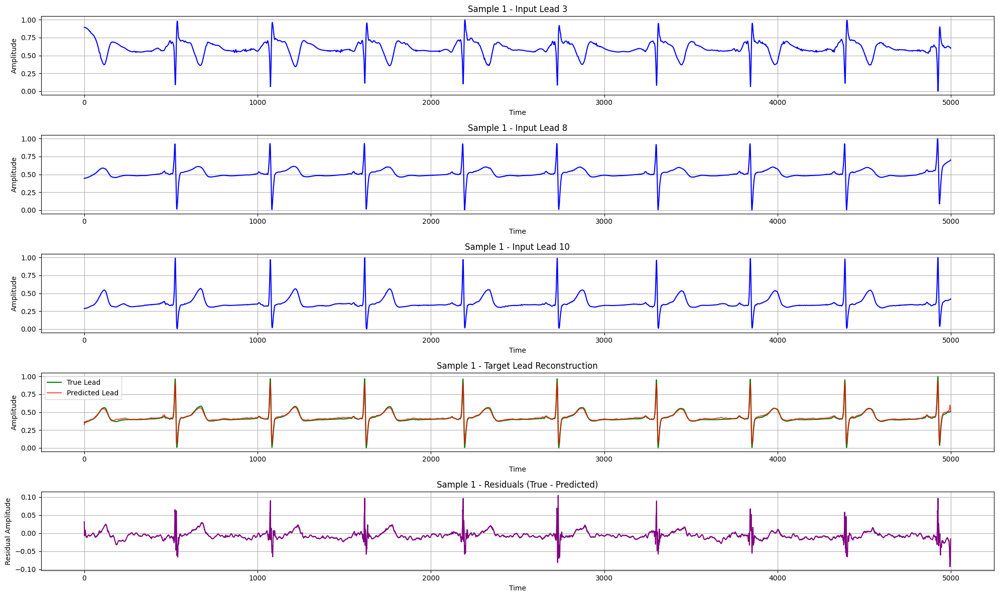

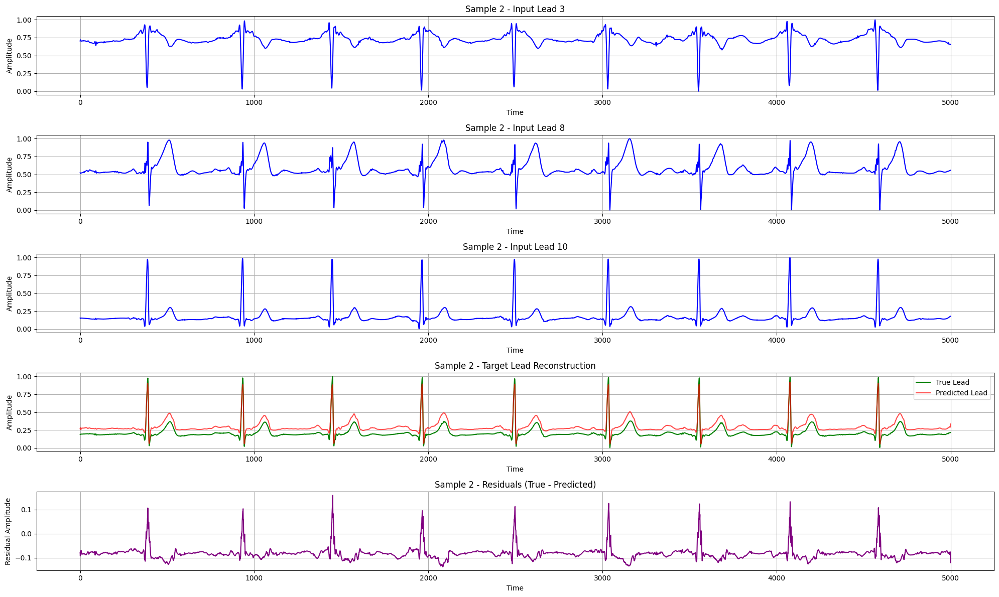

22/22 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step


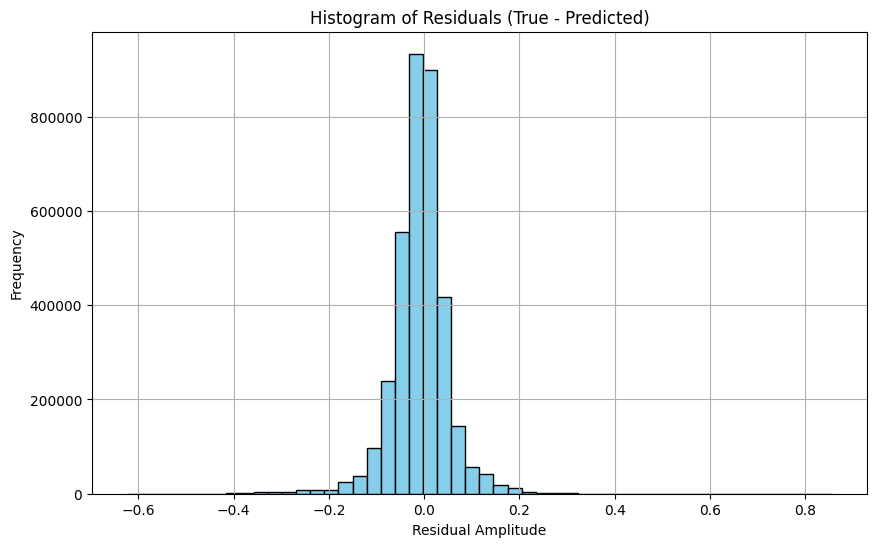

In [25]:
target_lead = 9
input_leads = [3, 8, 10]
handle_lead_model(target_lead, input_leads)

## Lead 11

X_train shape: (3986, 5000, 3)
y_train shape: (3986, 5000, 1)
X_val shape:   (704, 5000, 3)
y_val shape:   (704, 5000, 1)
Epoch 1/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 70s 77ms/step - cosine_similarity: 0.1980 - loss: 0.8279 - rmse: 0.8742 - val_cosine_similarity: 0.9231 - val_loss: 0.1298 - val_rmse: 0.1214 - learning_rate: 1.0000e-04
Epoch 2/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.6768 - loss: 0.2893 - rmse: 0.2805 - val_cosine_similarity: 0.9666 - val_loss: 0.0932 - val_rmse: 0.0850 - learning_rate: 1.0000e-04
Epoch 3/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.8090 - loss: 0.2000 - rmse: 0.1911 - val_cosine_similarity: 0.9707 - val_loss: 0.0847 - val_rmse: 0.0764 - learning_rate: 1.0000e-04
Epoch 4/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.8894 - loss: 0.1467 - rmse: 0.1381 - val_cosine_similarity: 0.9848 - val_loss: 0.0695 - val_rmse: 0.0621 - learning_rate: 1.0000e-04
Epoch 5/100
499/499 ━━━━━━━━━━━━━━

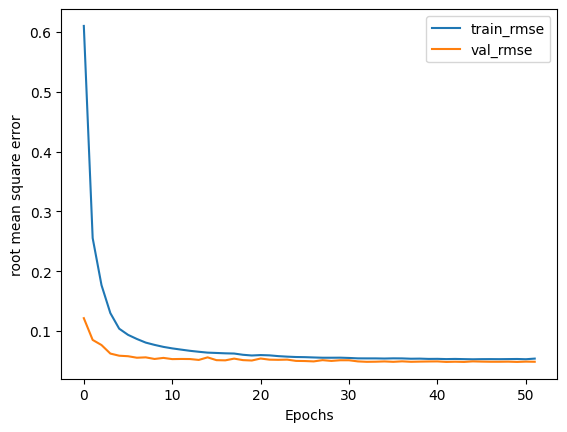

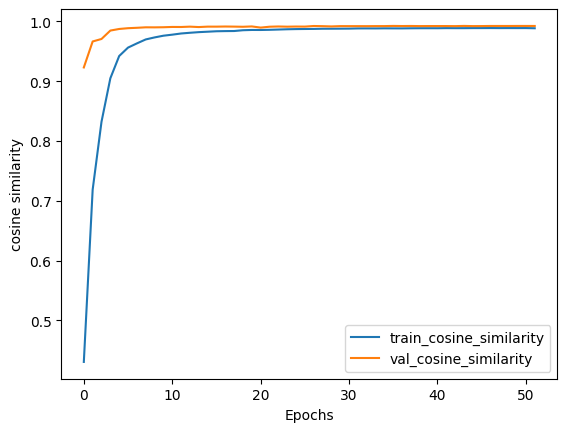

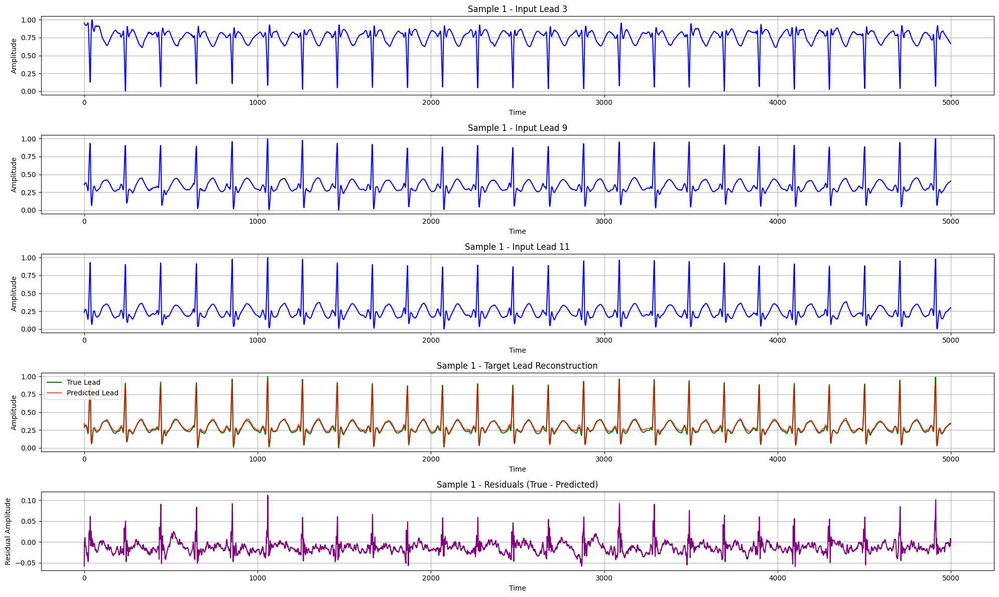

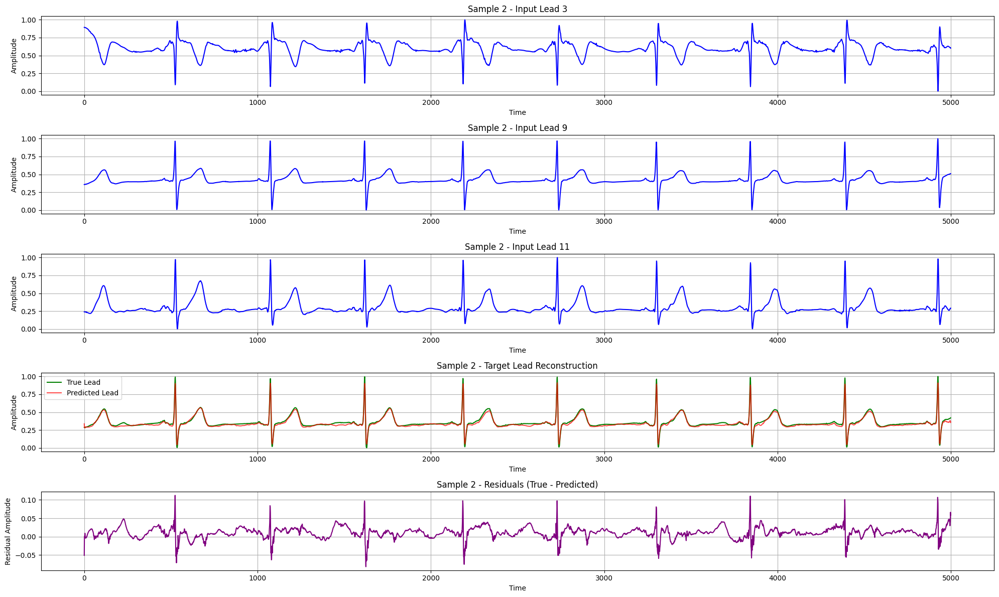

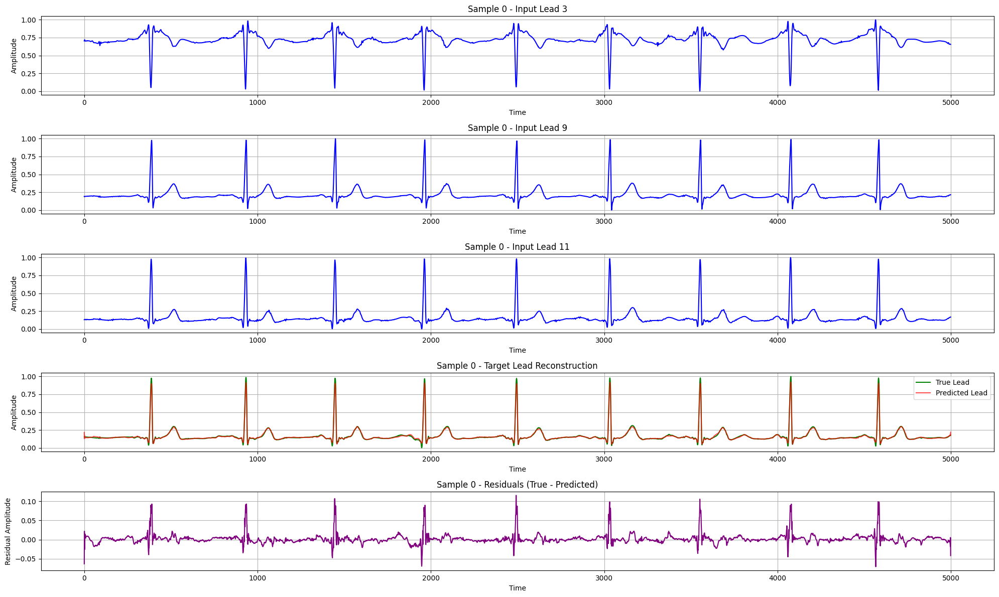

22/22 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step


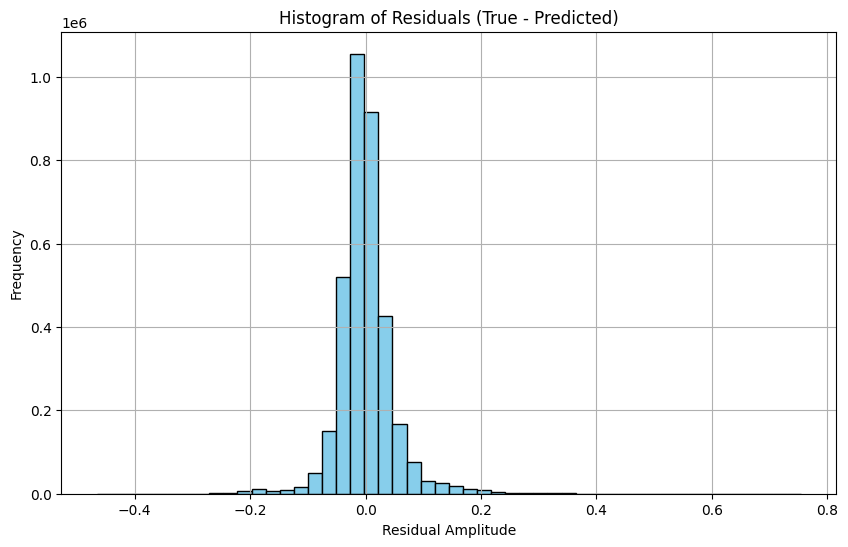

In [26]:
target_lead = 10
input_leads = [3, 9, 11]
handle_lead_model(target_lead, input_leads)

## Lead 12

X_train shape: (3986, 5000, 3)
y_train shape: (3986, 5000, 1)
X_val shape:   (704, 5000, 3)
y_val shape:   (704, 5000, 1)
Epoch 1/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 73s 78ms/step - cosine_similarity: 0.2478 - loss: 0.8911 - rmse: 0.9342 - val_cosine_similarity: 0.8988 - val_loss: 0.1330 - val_rmse: 0.1243 - learning_rate: 1.0000e-04
Epoch 2/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.6421 - loss: 0.2796 - rmse: 0.2712 - val_cosine_similarity: 0.9647 - val_loss: 0.0842 - val_rmse: 0.0768 - learning_rate: 1.0000e-04
Epoch 3/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - cosine_similarity: 0.8114 - loss: 0.1755 - rmse: 0.1668 - val_cosine_similarity: 0.9728 - val_loss: 0.0742 - val_rmse: 0.0668 - learning_rate: 1.0000e-04
Epoch 4/100
499/499 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - cosine_similarity: 0.8892 - loss: 0.1333 - rmse: 0.1246 - val_cosine_similarity: 0.9773 - val_loss: 0.0703 - val_rmse: 0.0632 - learning_rate: 1.0000e-04
Epoch 5/100
499/499 ━━━━━━━━━━━━━━

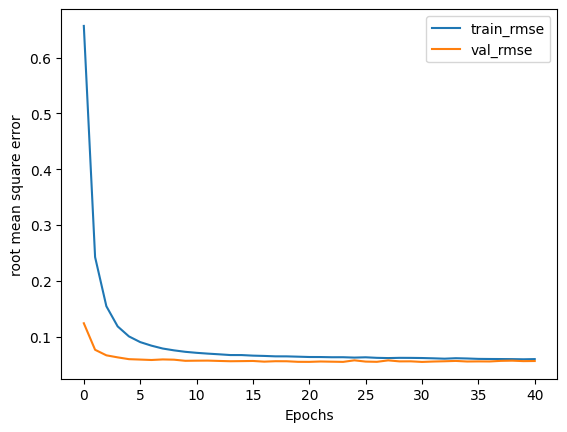

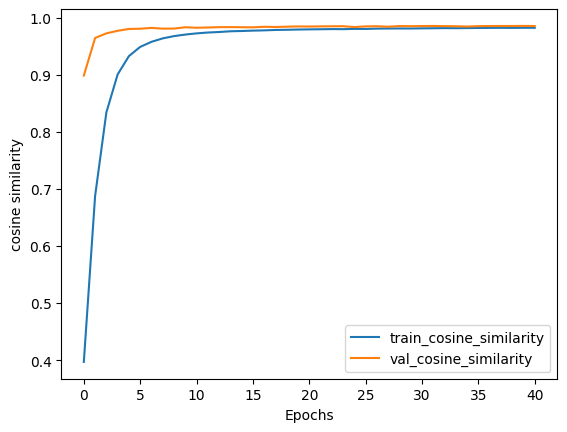

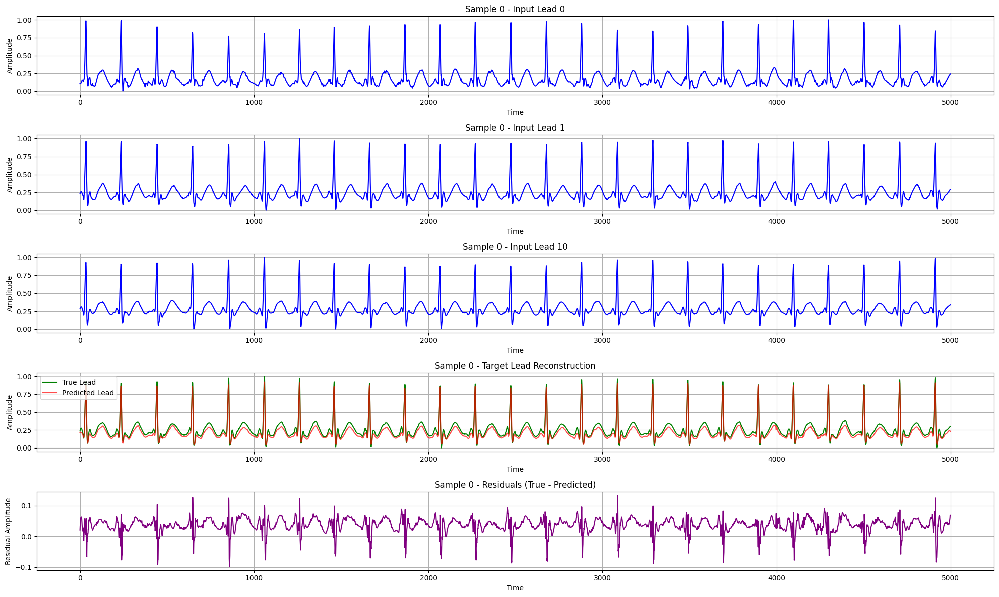

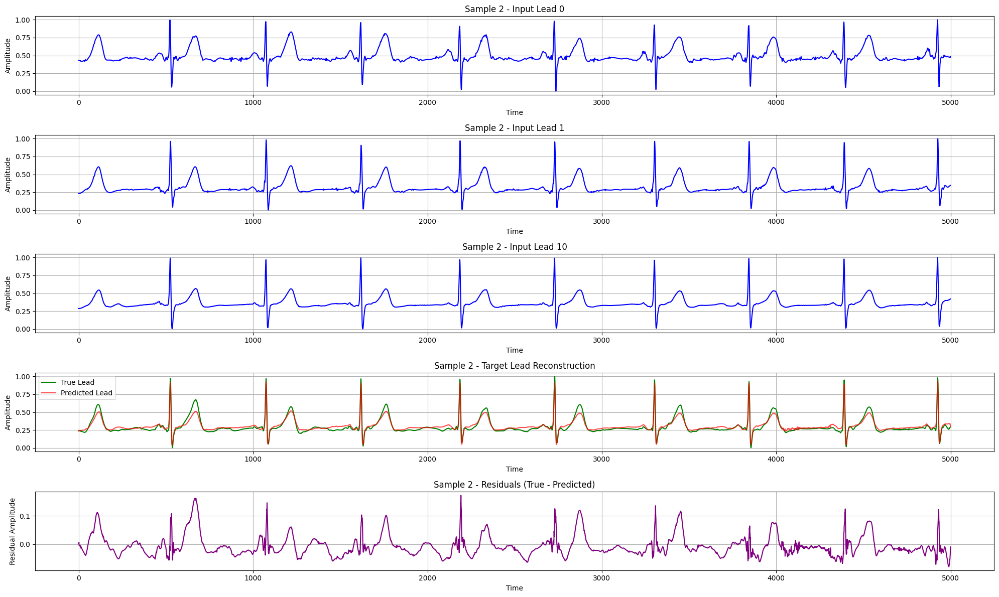

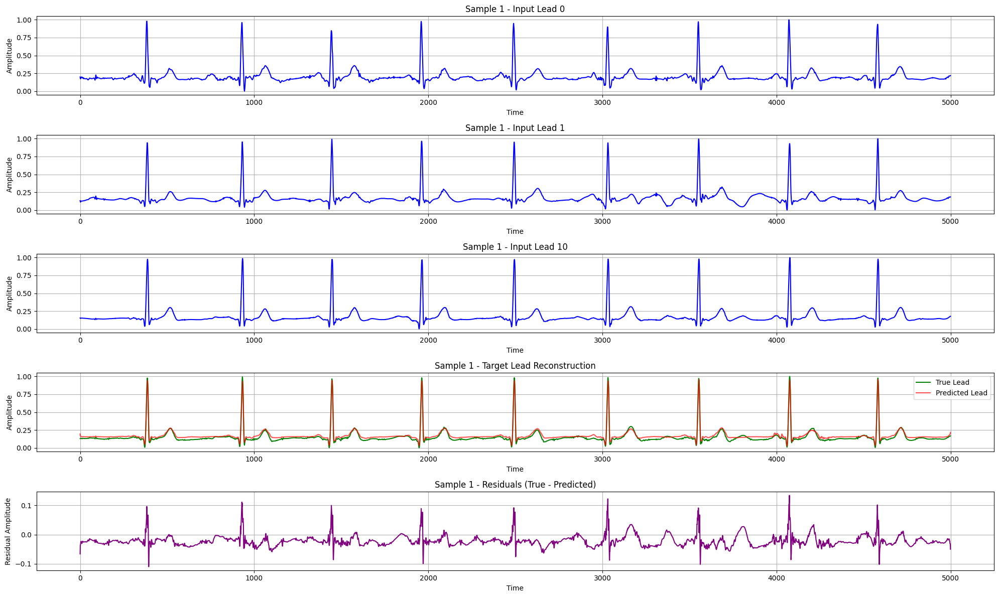

22/22 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step


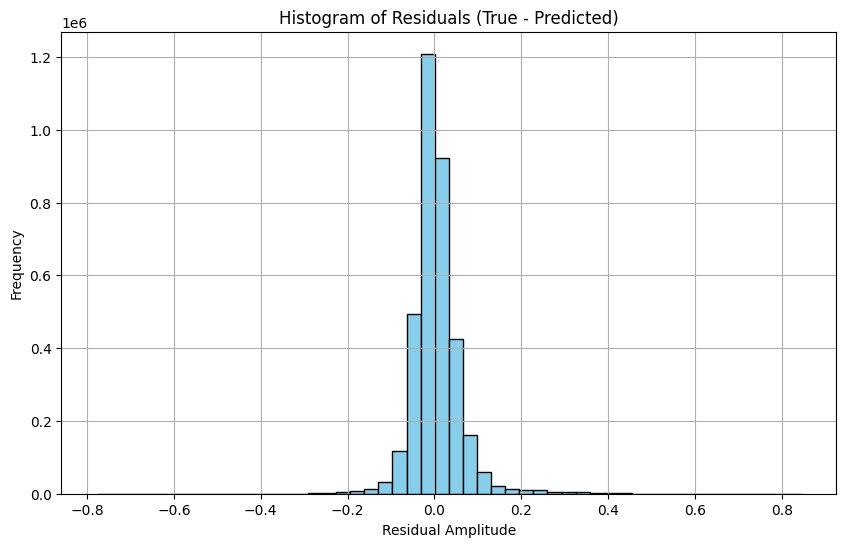

In [27]:
target_lead = 11
input_leads = [0, 1, 10]
handle_lead_model(target_lead, input_leads)

# Load Models for further processing if needed

In [28]:
def load_lead_model(lead_number):
    """
    Loads a pre-trained ECG restoration model for a specific lead number.
    
    This function retrieves the Keras model corresponding to the specified ECG lead
    by loading it from a predefined file path. It includes custom objects required
    for the model's architecture and loss function.
    
    Parameters:
        lead_number (int): The index of the ECG lead for which the model is to be loaded.
    
    Returns:
        keras.Model: The loaded Keras model ready for inference or further training.
    """
    # Construct the file path for the specified lead's model
    model_path = f'/kaggle/input/chunk1-ecg/results/Lead{lead_number}_Model.keras'
    
    # Load the Keras model with custom objects required for the model's architecture and loss function
    return keras.models.load_model(
        model_path,
        custom_objects={
            'PositionalEncoding': PositionalEncoding,  # Custom layer used in the model
            'rmse_loss': rmse_loss                      # Custom loss function used during training
        }
    )

# -------------------------------------------------------------------------
# Load Models for All 12 ECG Leads (0 to 11)
# -------------------------------------------------------------------------
# Initialize and load models for each ECG lead by specifying the lead number
model_lead_0  = load_lead_model(0)
model_lead_1  = load_lead_model(1)
model_lead_2  = load_lead_model(2)
model_lead_3  = load_lead_model(3)
model_lead_4  = load_lead_model(4)
model_lead_5  = load_lead_model(5)
model_lead_6  = load_lead_model(6)
model_lead_7  = load_lead_model(7)
model_lead_8  = load_lead_model(8)
model_lead_9  = load_lead_model(9)
model_lead_10 = load_lead_model(10)
model_lead_11 = load_lead_model(11)


## Summary of the implemented model (if needed)

In [29]:
model_lead_0.summary()

Model: "ECG_Restoration_UNet_Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ ecg_input (InputLayer)    │ (None, 5000, 3)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ enc_block1_conv1 (Conv1D) │ (None, 2500, 32)       │            512 │ ecg_input[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ enc_block1_bn1            │ (None, 2500, 32)       │            128 │ enc_block1_conv1[0][0] │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ enc_block1_relu1 (ReLU)   │ (None, 2500, 32)       │              0 │ enc_block1_bn1[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ enc_block1_conv_skip      │ (None, 2500, 32)       │            128 │ ecg_input[0][0]        │
│ (Conv1D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ enc_block1_conv2 (Conv1D) │ (None, 2500, 32)       │          5,152 │ enc_block1_relu1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ enc_block1_bn_skip        │ (None, 2500, 32)       │            128 │ enc_block1_conv_skip[… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ enc_block1_bn2            │ (None, 2500, 32)       │            128 │ enc_block1_conv2[0][0] │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ enc_block1_add (Add)      │ (None, 2500, 32)       │              0 │ enc_block1_bn_skip[0]… │
│                           │                        │                │ enc_block1_bn2[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ enc_block1_relu2 (ReLU)   │ (None, 2500, 32)       │              0 │ enc_block1_add[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ enc_block1_dropout        │ (None, 2500, 32)       │              0 │ enc_block1_relu2[0][0] │
│ (Dropout)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ enc_block2_conv1 (Conv1D) │ (None, 1250, 64)       │          6,208 │ enc_block1_dropout[0]… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ enc_block2_bn1            │ (None, 1250, 64)       │            256 │ enc_block2_conv1[0][0] │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ enc_block2_relu1 (ReLU)   │ (None, 1250, 64)       │              0 │ enc_block2_bn1[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ enc_block2_conv_skip      │ (None, 1250, 64)       │          2,112 │ enc_block1_dropout[0]… │
│ (Conv1D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ enc_block2_conv2 (Con

 Total params: 373,865 (1.43 MB)

 Trainable params: 124,321 (485.63 KB)

 Non-trainable params: 896 (3.50 KB)

 Optimizer params: 248,648 (971.29 KB)